# **UNIT 1 & 2 : DATA COLLECTION**

Memanggil library yang dibutuhkan dalam data analysis

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)

Panggil Dataset

Untuk pemanggilan langsung dari web

In [ ]:
# url = "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data"

# column_names = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']

# df = pd.read_csv(url, names=column_names, skipinitialspace=True, na_values="?")

# df.head(5)

Pemanggilan melalui drive yang terdapat pada google drive

Perlu diperhatikan, jika menggunakan google drive sebagai tempat untuk meletakkan dataset, maka gunakan dua script berikut ini untuk mendefinisikan lokasi file dan menghubungkan google drive dengan colab.

Mendefinisikan variabel lokasi drive


In [ ]:
# Define the variable
folder_name = "/content/drive/My Drive/Colab Notebooks/Machine_learning IF6/01_adult_klasifikasi"

Membuat Penghubung Google Drive dan Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import sys
sys.path.append(f'{folder_name}')

Mounted at /content/drive


In [ ]:
column_names = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']

df = pd.read_csv(f'{folder_name}/adult.data', sep=',', names=column_names, skipinitialspace=True, na_values="?")

df.head(5)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


Pembacaan Dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       30725 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      30718 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  31978 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


Pembacaan Dataset terkait nilai yang hilang

In [ ]:
missing_values = df.isnull().sum()
print("\nJumlah missing value per kolom:")
print(missing_values)


Jumlah missing value per kolom:
age                  0
workclass         1836
fnlwgt               0
education            0
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
income               0
dtype: int64


Menghitung Persentase Nilai yang Hilang

In [ ]:
missing_percentage = (missing_values / len(df)) * 100
print("\nPersentase missing value per kolom:")
print(missing_percentage)


Persentase missing value per kolom:
age               0.000000
workclass         5.638647
fnlwgt            0.000000
education         0.000000
education_num     0.000000
marital_status    0.000000
occupation        5.660146
relationship      0.000000
race              0.000000
sex               0.000000
capital_gain      0.000000
capital_loss      0.000000
hours_per_week    0.000000
native_country    1.790486
income            0.000000
dtype: float64


Kegiatan Menelaah Data

Membaca Deskripsi Data

In [ ]:
df.describe()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


Membaca deskripsi data untuk data dalam bentuk Teks (object)

In [ ]:
df.describe(include=['object'])

,workclass,education,marital_status,occupation,relationship,race,sex,native_country,income
count,30725,32561,32561,30718,32561,32561,32561,31978,32561
unique,8,16,7,14,6,5,2,41,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27816,21790,29170,24720


In [ ]:
df['income'].value_counts(normalize=True)

,proportion
income,
<=50K,0.75919
>50K,0.24081


Melakukan Visualisasi Distribusi

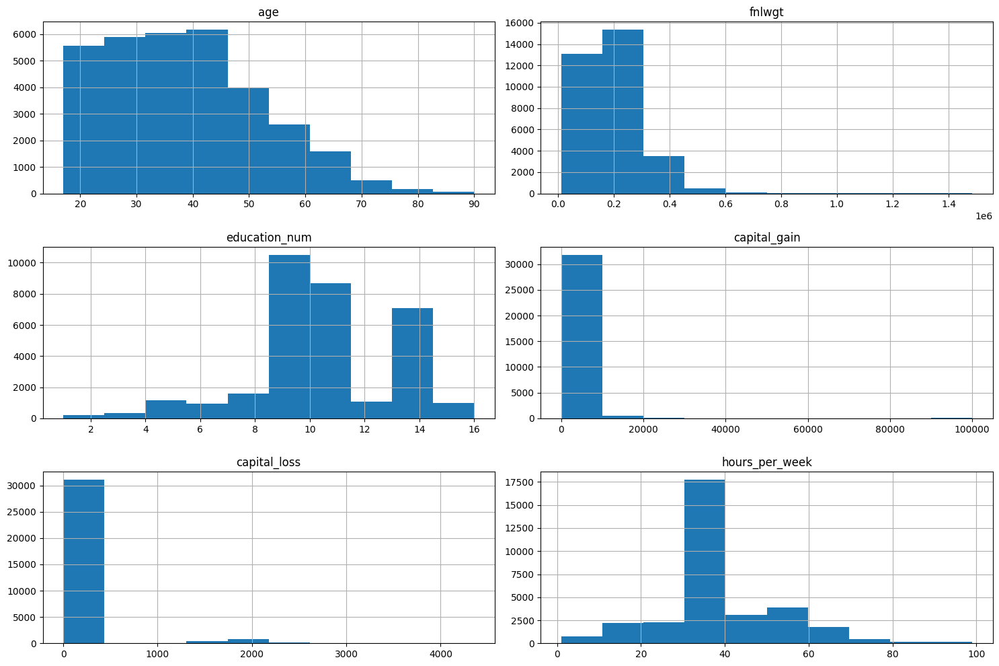

In [ ]:
numeric_features = df.select_dtypes(include=[np.number]).columns
df[numeric_features].hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

Untuk data bersifat objek (kategorikal)

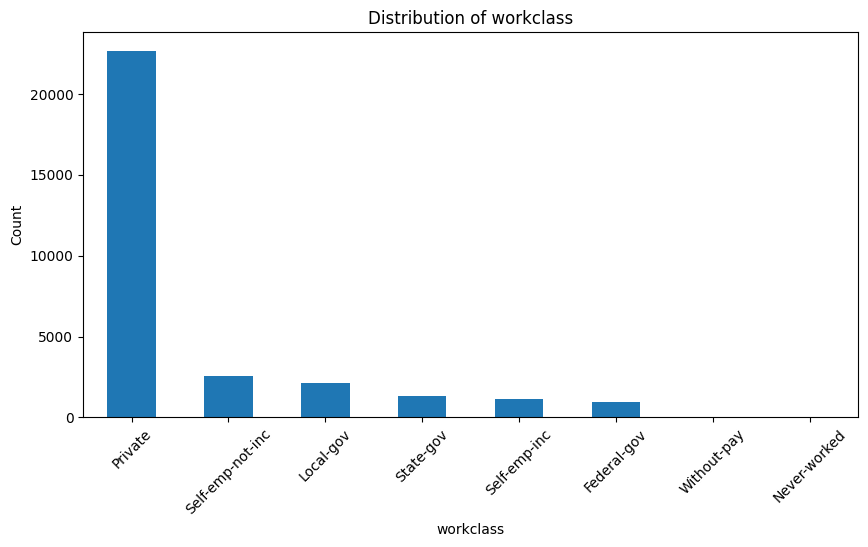

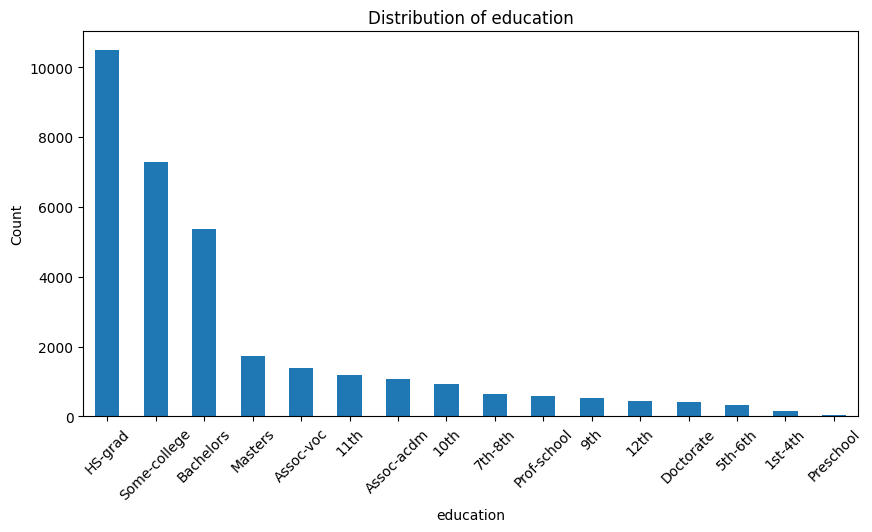

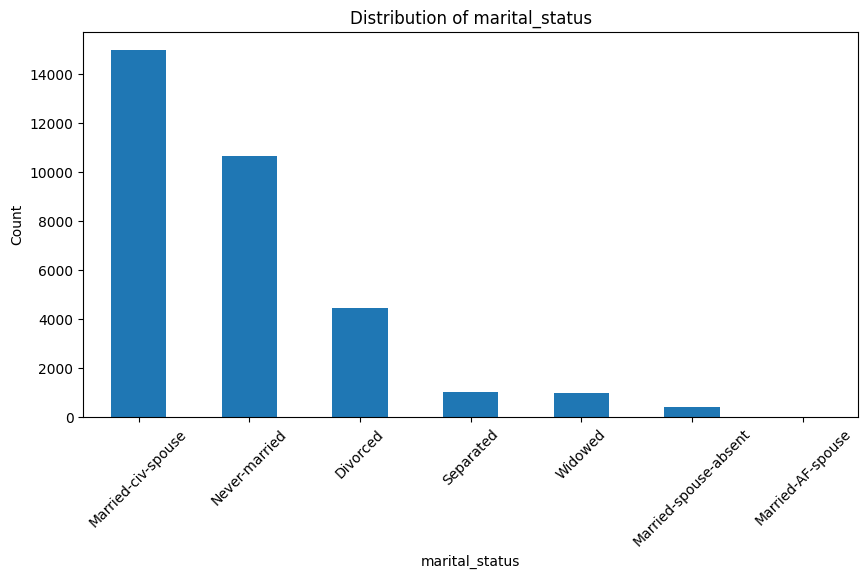

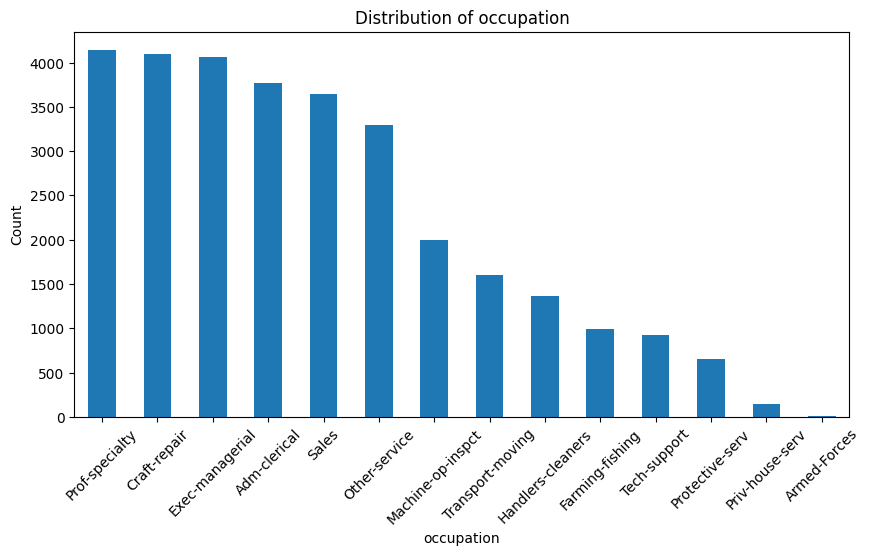

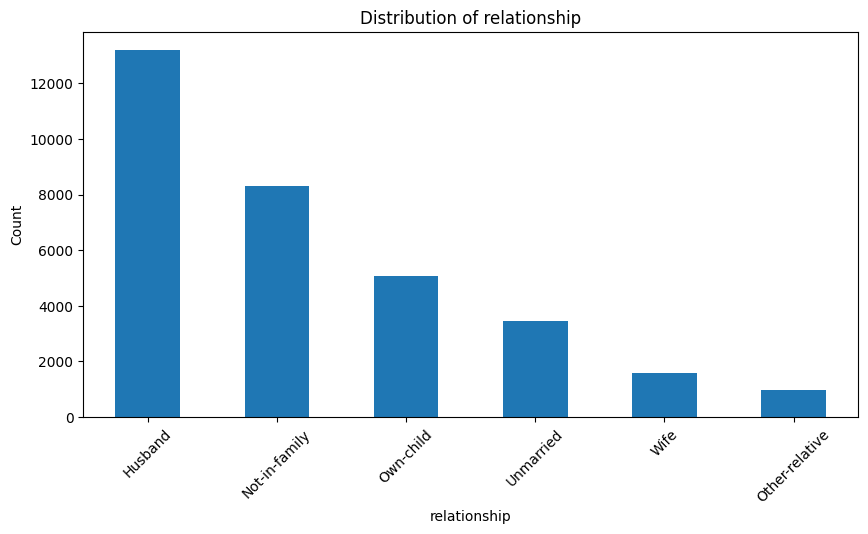

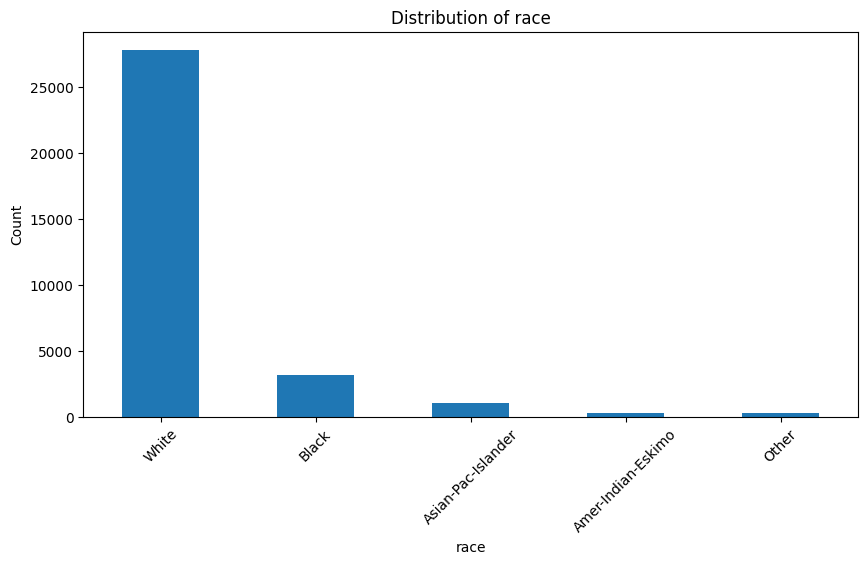

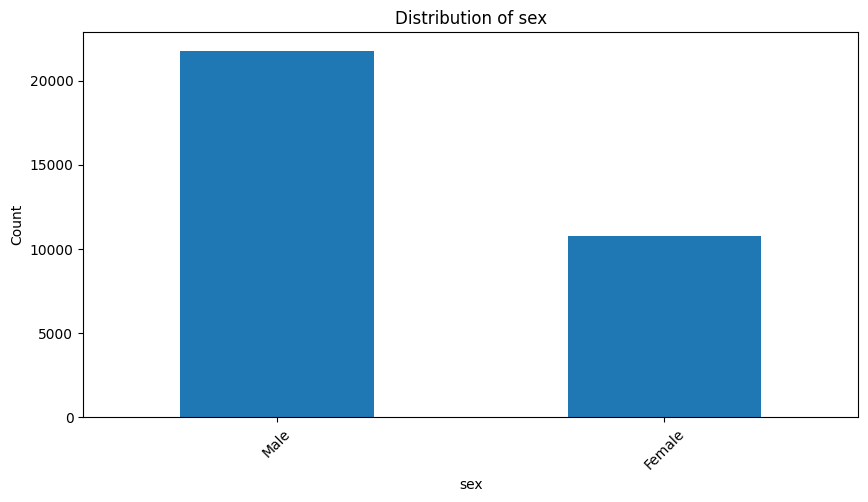

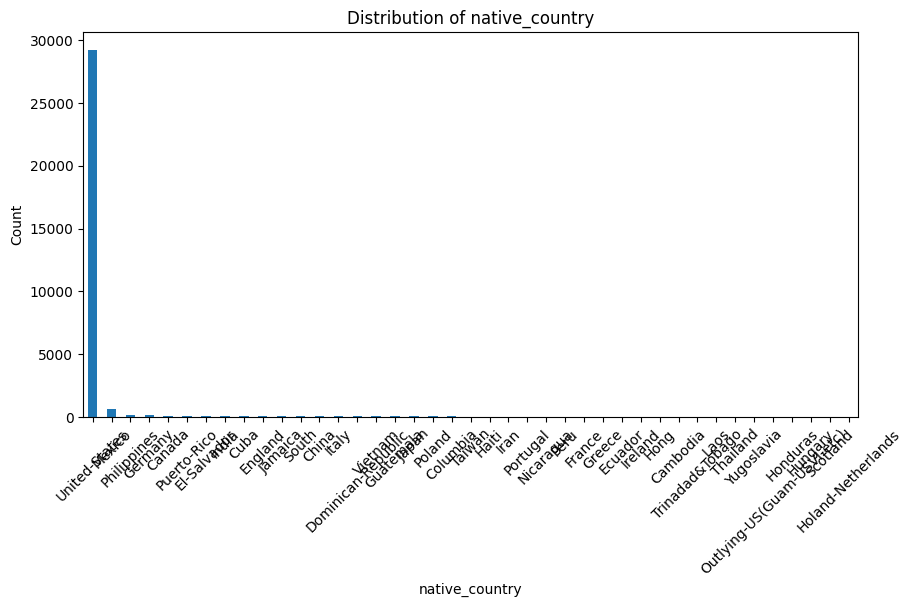

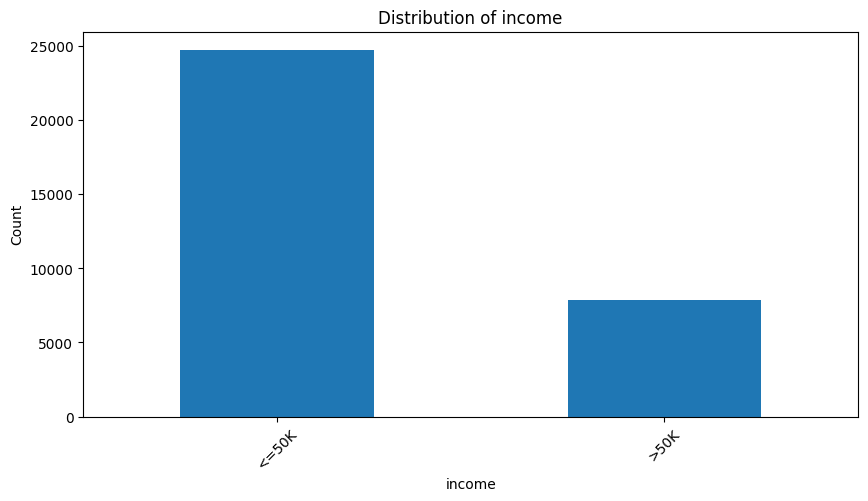

In [ ]:
categorical_features = df.select_dtypes(include=['object']).columns
for feature in categorical_features:
    plt.figure(figsize=(10, 5))
    df[feature].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {feature}')
    plt.ylabel('Count')
    plt.xlabel(feature)
    plt.xticks(rotation=45)
    plt.show()

Analisis Korelasi

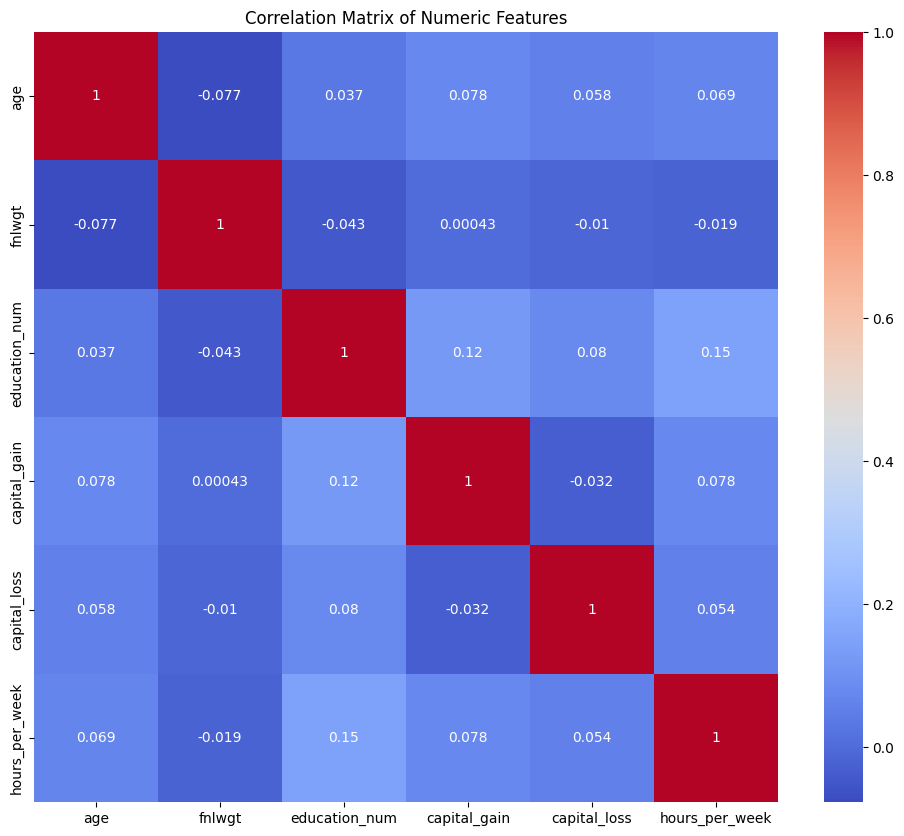

In [ ]:
correlation_matrix = df[numeric_features].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()

Analisis Hubungan Target Variabel

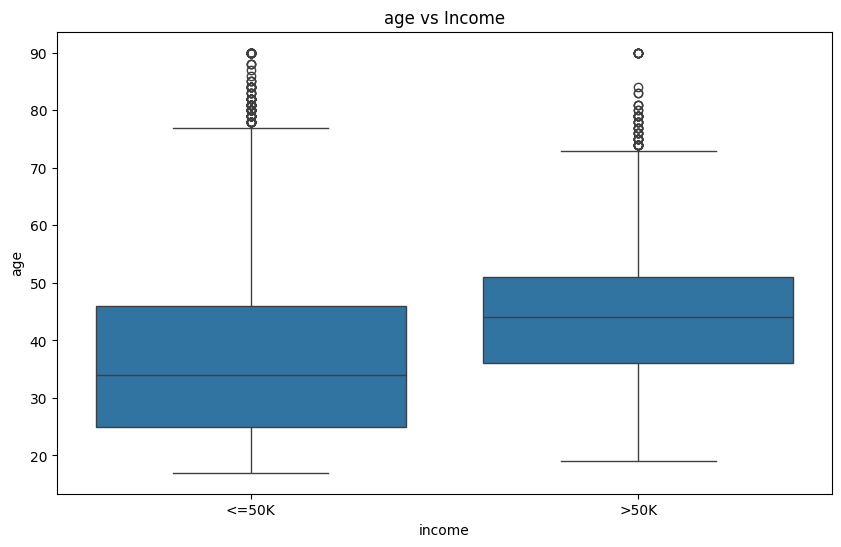

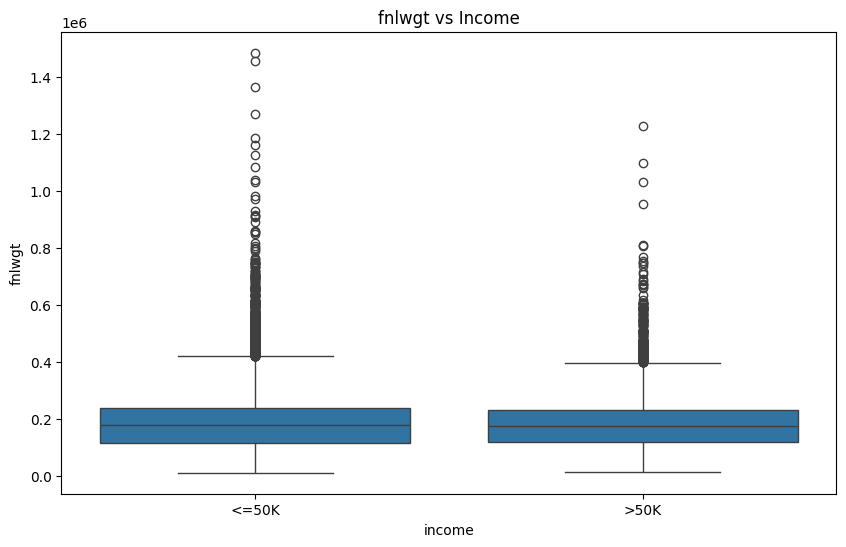

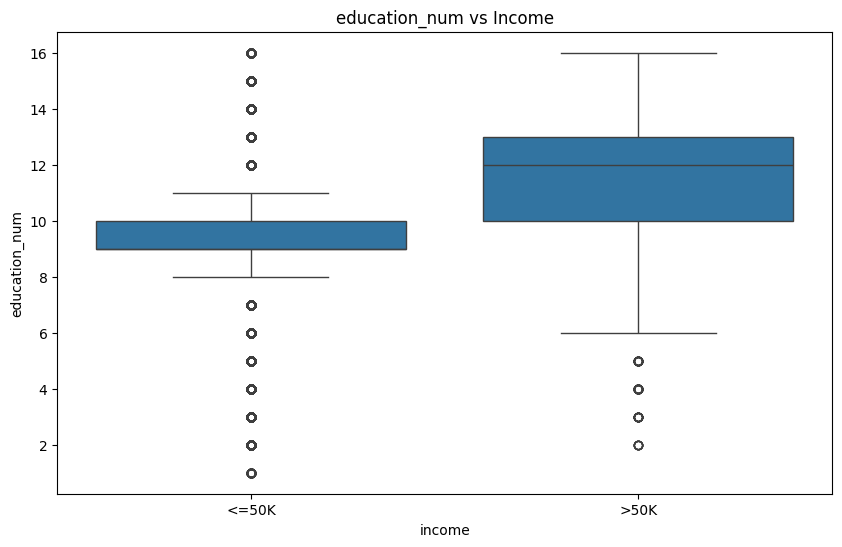

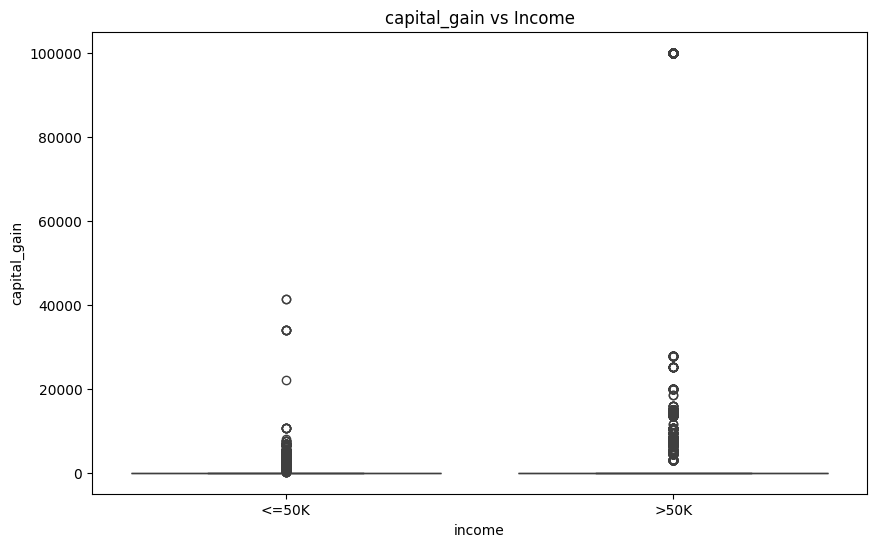

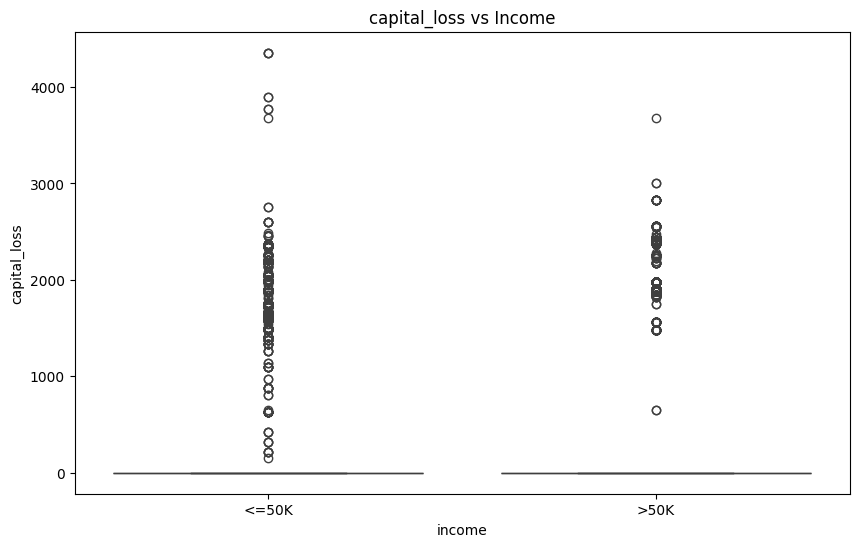

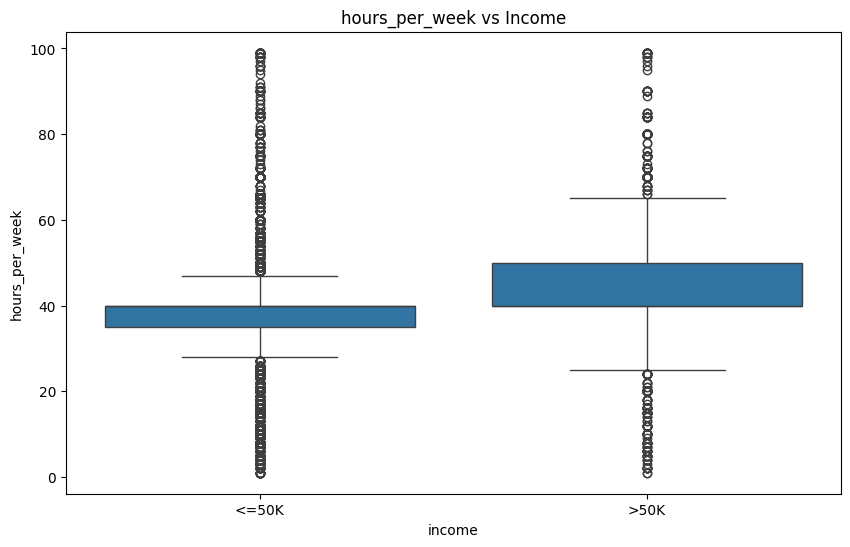

In [ ]:
for feature in numeric_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='income', y=feature, data=df)
    plt.title(f'{feature} vs Income')
    plt.show()

Analisis untuk nilai kategorikal dengan target

<Figure size 1800x600 with 0 Axes>

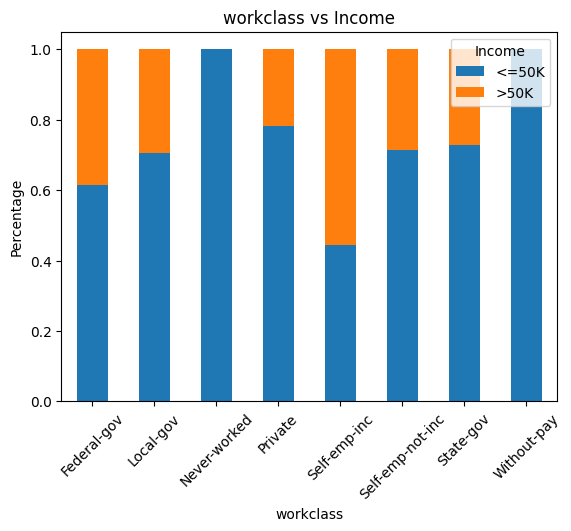

<Figure size 1800x600 with 0 Axes>

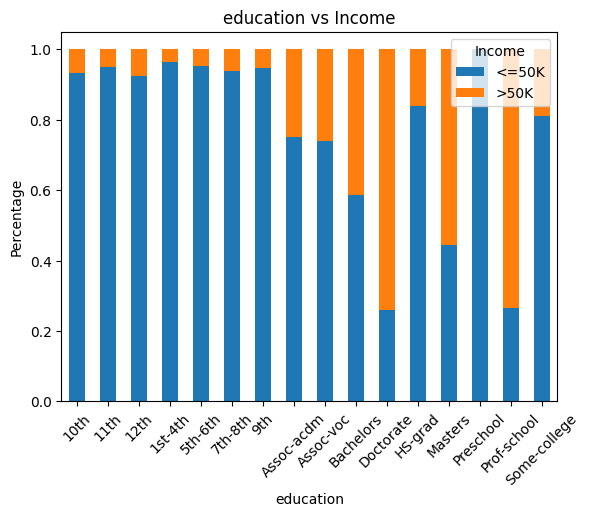

<Figure size 1800x600 with 0 Axes>

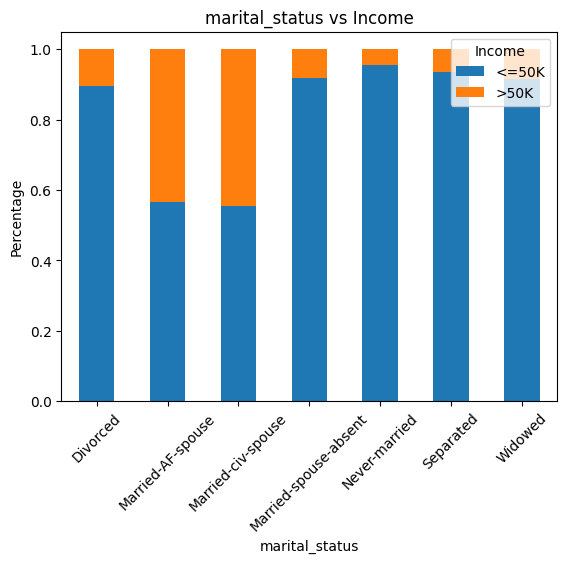

<Figure size 1800x600 with 0 Axes>

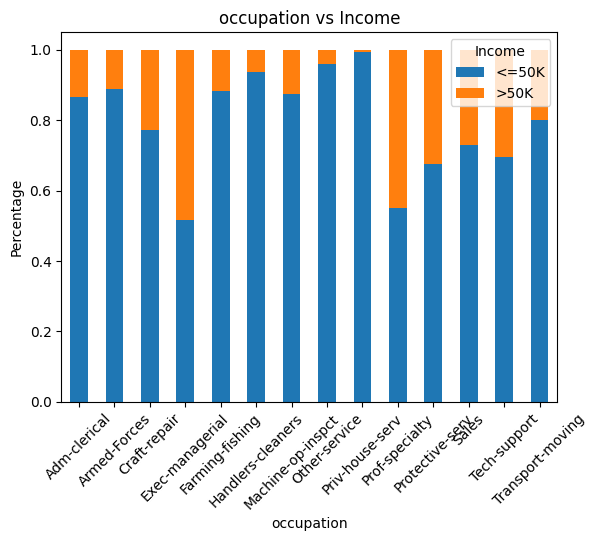

<Figure size 1800x600 with 0 Axes>

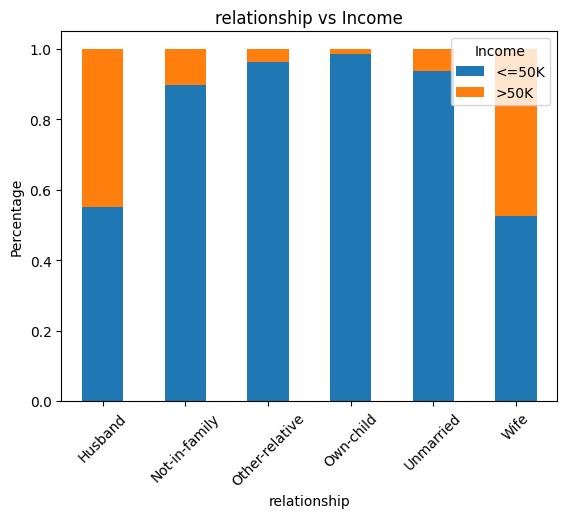

<Figure size 1800x600 with 0 Axes>

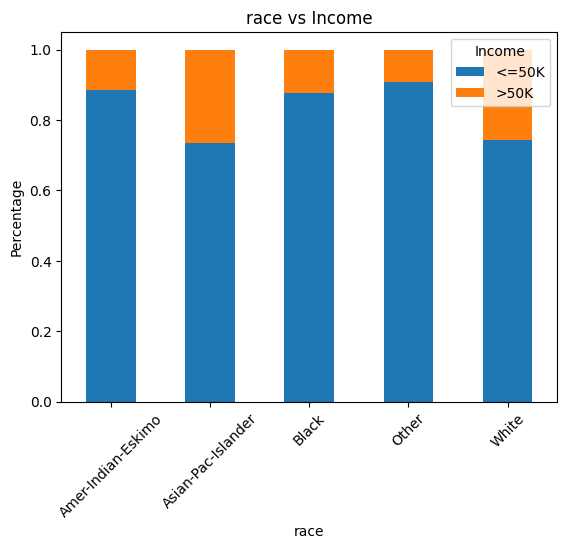

<Figure size 1800x600 with 0 Axes>

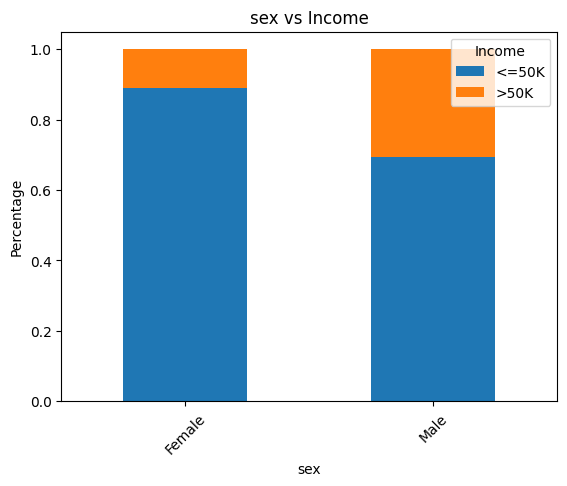

<Figure size 1800x600 with 0 Axes>

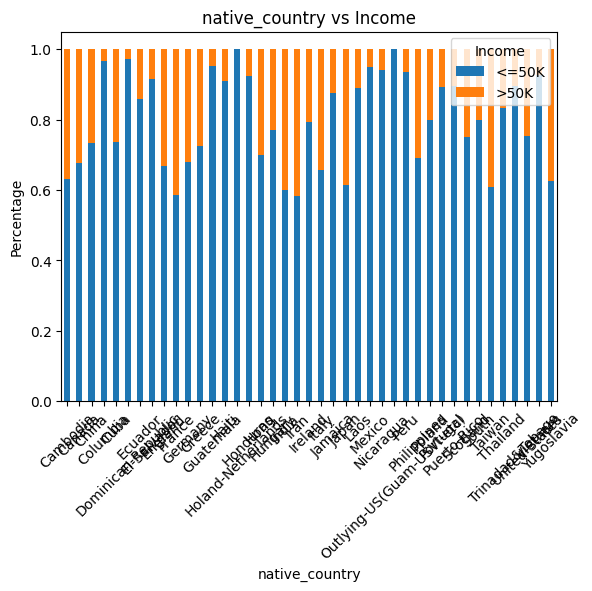

In [ ]:
for feature in categorical_features:
    if feature != 'income':
        plt.figure(figsize=(18, 6))
        df_temp = df.groupby([feature, 'income']).size().unstack()
        df_temp_perc = df_temp.div(df_temp.sum(axis=1), axis=0)
        df_temp_perc.plot(kind='bar', stacked=True)
        plt.title(f'{feature} vs Income')
        plt.xlabel(feature)
        plt.ylabel('Percentage')
        plt.legend(title='Income', loc='upper right')
        plt.xticks(rotation=45)
        plt.show()

Identifikasi Outlier

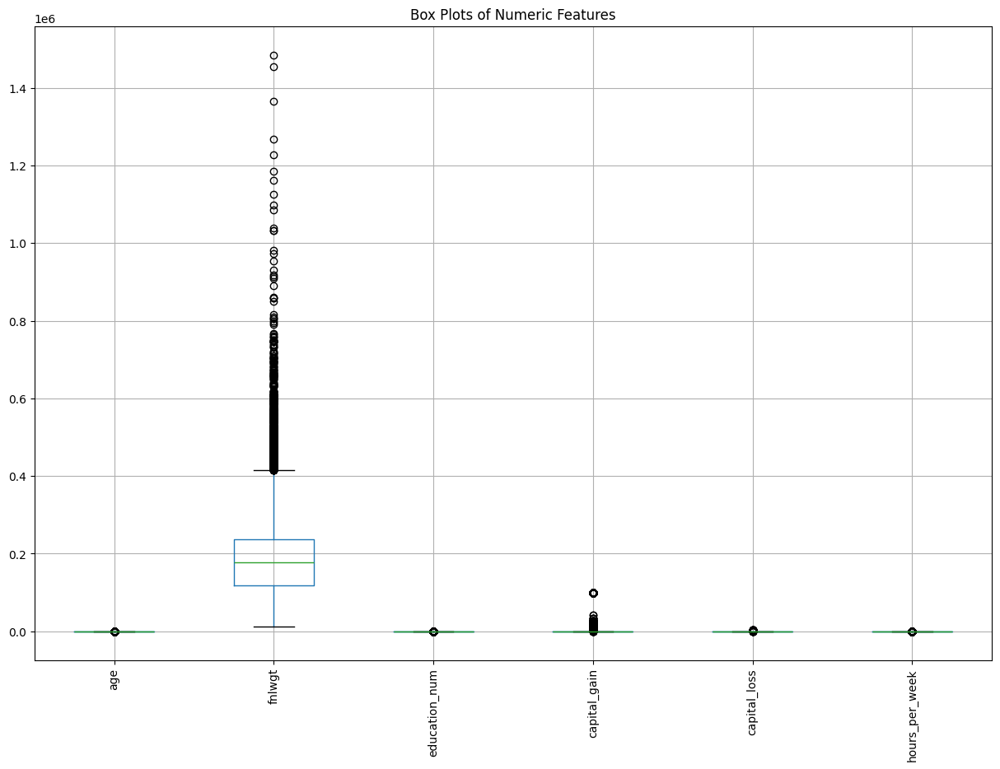

In [ ]:
plt.figure(figsize=(15, 10))
df[numeric_features].boxplot()
plt.title('Box Plots of Numeric Features')
plt.xticks(rotation=90)
plt.show()

#**UNIT 3 : VALIDASI DATA**

Periksa Ulang Data Missing

In [ ]:
# Hitung jumlah missing values
missing_values = df.isnull().sum()

# Hitung persentase missing values
missing_percentage = 100 * df.isnull().sum() / len(df)

# Gabungkan informasi missing values
missing_table = pd.concat([missing_values, missing_percentage], axis=1, keys=['Total', 'Percent'])

print(missing_table)

                Total   Percent
age                 0  0.000000
workclass        1836  5.638647
fnlwgt              0  0.000000
education           0  0.000000
education_num       0  0.000000
marital_status      0  0.000000
occupation       1843  5.660146
relationship        0  0.000000
race                0  0.000000
sex                 0  0.000000
capital_gain        0  0.000000
capital_loss        0  0.000000
hours_per_week      0  0.000000
native_country    583  1.790486
income              0  0.000000


Visualisasi Total Missing Value per Kolom

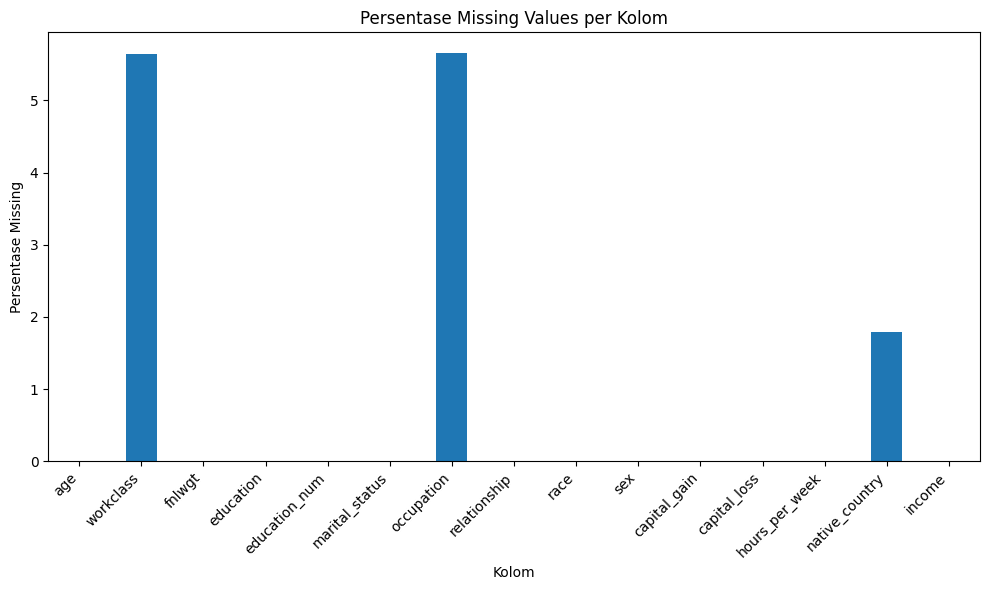

In [ ]:
# Visualisasi missing values
plt.figure(figsize=(10, 6))
missing_percentage.plot(kind='bar')
plt.title('Persentase Missing Values per Kolom')
plt.xlabel('Kolom')
plt.ylabel('Persentase Missing')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Periksa Duplikat

-Data duplikat sebaiknya dihindari pada data feature, pada target tidak masalah ada duplikat.

-Solusinya adalah hapus salah satu atau ubah label class, biasanya pada data yang banyak adalah hapus saja.

In [ ]:
# Hitung jumlah duplikat
duplicates = df.duplicated().sum()
print(f"Jumlah baris duplikat: {duplicates}")

# Tampilkan beberapa baris duplikat (jika ada)
if duplicates > 0:
    print("\nContoh baris duplikat:")
    print(df[df.duplicated(keep=False)].head(24))

Jumlah baris duplikat: 24

Contoh baris duplikat:
       age         workclass  fnlwgt     education  education_num  \
2303    90           Private   52386  Some-college             10   
3917    19           Private  251579  Some-college             10   
4325    25           Private  308144     Bachelors             13   
4767    21           Private  250051  Some-college             10   
4881    25           Private  308144     Bachelors             13   
4940    38           Private  207202       HS-grad              9   
5104    90           Private   52386  Some-college             10   
5579    27           Private  255582       HS-grad              9   
5805    20           Private  107658  Some-college             10   
5842    25           Private  195994       1st-4th              2   
6990    19           Private  138153  Some-college             10   
7053    49  Self-emp-not-inc   43479  Some-college             10   
7920    49           Private   31267       7th-8th   

Validasi Tipe Data

In [ ]:
print(df.dtypes)

# Periksa apakah ada nilai non-numerik dalam kolom numerik
numeric_columns = df.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    non_numeric = df[pd.to_numeric(df[col], errors='coerce').isna()]
    if len(non_numeric) > 0:
        print(f"\nNilai non-numerik dalam kolom {col}:")
        print(non_numeric[col].unique())

age                int64
workclass         object
fnlwgt             int64
education         object
education_num      int64
marital_status    object
occupation        object
relationship      object
race              object
sex               object
capital_gain       int64
capital_loss       int64
hours_per_week     int64
native_country    object
income            object
dtype: object


Validasi Range Nilai

In [ ]:
# Periksa range nilai untuk kolom numerik
for col in numeric_columns:
    print(f"\nRange nilai untuk {col}:")
    print(f"Min: {df[col].min()}, Max: {df[col].max()}")

# Periksa kategori unik untuk kolom kategorikal
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nKategori unik dalam {col}:")
    print(df[col].unique())


Range nilai untuk age:
Min: 17, Max: 90

Range nilai untuk fnlwgt:
Min: 12285, Max: 1484705

Range nilai untuk education_num:
Min: 1, Max: 16

Range nilai untuk capital_gain:
Min: 0, Max: 99999

Range nilai untuk capital_loss:
Min: 0, Max: 4356

Range nilai untuk hours_per_week:
Min: 1, Max: 99

Kategori unik dalam workclass:
['State-gov' 'Self-emp-not-inc' 'Private' 'Federal-gov' 'Local-gov' nan
 'Self-emp-inc' 'Without-pay' 'Never-worked']

Kategori unik dalam education:
['Bachelors' 'HS-grad' '11th' 'Masters' '9th' 'Some-college' 'Assoc-acdm'
 'Assoc-voc' '7th-8th' 'Doctorate' 'Prof-school' '5th-6th' '10th'
 '1st-4th' 'Preschool' '12th']

Kategori unik dalam marital_status:
['Never-married' 'Married-civ-spouse' 'Divorced' 'Married-spouse-absent'
 'Separated' 'Married-AF-spouse' 'Widowed']

Kategori unik dalam occupation:
['Adm-clerical' 'Exec-managerial' 'Handlers-cleaners' 'Prof-specialty'
 'Other-service' 'Sales' 'Craft-repair' 'Transport-moving'
 'Farming-fishing' 'Machine-op-in

Periksa Konsistensi Data

Fitur Engineering
- One Hot Encoding = False (0) True (1)
- Ontologies = Fitur diubah berdasarkan range nilai atau urutan tertentu

In [ ]:
# Contoh: Periksa konsistensi antara 'education' dan 'education_num'
education_mapping = df.groupby('education')['education_num'].mean().sort_values()
print("\nPemetaan rata-rata 'education_num' untuk setiap 'education':")
print(education_mapping)


Pemetaan rata-rata 'education_num' untuk setiap 'education':
education
Preschool        1.0
1st-4th          2.0
5th-6th          3.0
7th-8th          4.0
9th              5.0
10th             6.0
11th             7.0
12th             8.0
HS-grad          9.0
Some-college    10.0
Assoc-voc       11.0
Assoc-acdm      12.0
Bachelors       13.0
Masters         14.0
Prof-school     15.0
Doctorate       16.0
Name: education_num, dtype: float64


Visualisasi Konsistensi

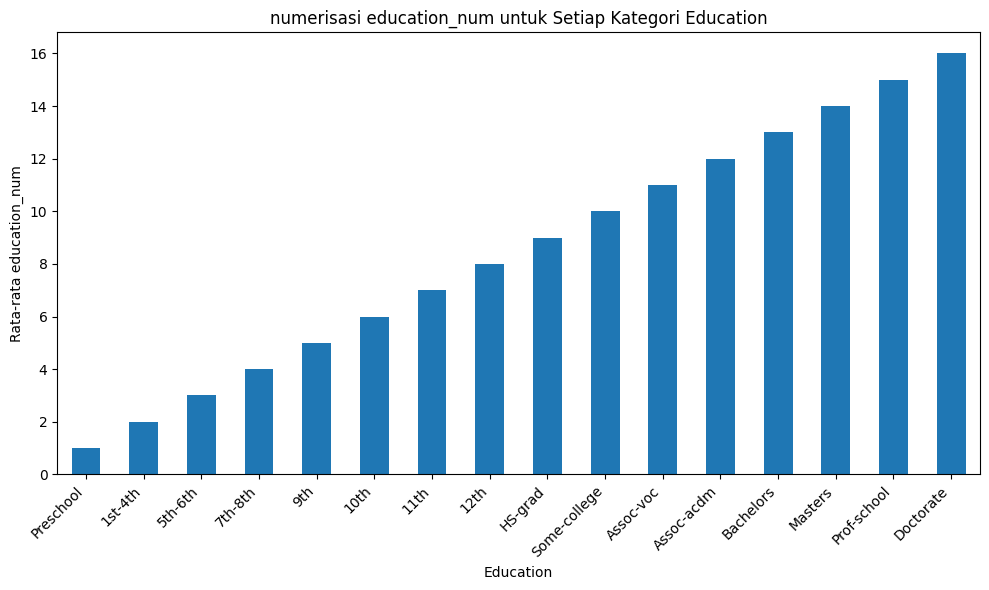

In [ ]:
# Visualisasi konsistensi
plt.figure(figsize=(10, 6))
education_mapping.plot(kind='bar')
plt.title('numerisasi education_num untuk Setiap Kategori Education')
plt.xlabel('Education')
plt.ylabel('Rata-rata education_num')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#**UNIT 4 : MENENTUKAN OBJECT DATA**

Pada Unit ini hanya menentukan keputusan terhadap fitur-fitur yang digunakan setelah
melakukan tahap Unit 2 dan 3. Objek utama dari pengidentifikasian dataset adult adalah :

• target adalah income

• Pada Unit 2 dan 3, semua fitur digunakan

#**UNIT 5 : MEMBERSIHKAN DATA**

Tujuan: Melakukan pembersihan data untuk meningkatkan kualitas dataset sebelum analisis dan pemodelan lebih lanjut

**Menangani Missing Values**

In [ ]:
# Cek missing values
print("Missing values sebelum pembersihan:")
print(df.isnull().sum())

# Menangani missing values
for column in df.columns:
    if df[column].dtype == 'object':
        # Untuk kolom kategorikal, isi dengan modus
        df[column].fillna(df[column].mode()[0], inplace=True)
    else:
        # Untuk kolom numerik, isi dengan median
        df[column].fillna(df[column].median(), inplace=True)

print("\nMissing values setelah pembersihan:")
print(df.isnull().sum())

Missing values sebelum pembersihan:
age                  0
workclass         1836
fnlwgt               0
education            0
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
income               0
dtype: int64

Missing values setelah pembersihan:
age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64


<ipython-input-25-aa6978263c5f>:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(df[column].median(), inplace=True)
<ipython-input-25-aa6978263c5f>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try

Untuk  menangani data yang hilang kita menggunakan fungsi statistik  khusus yang umum digunakan.

Data bernilai kategorikal (objek) menggunakan modus (mode) dimana akan digunakan untuk data yang paling sering muncul.

Sementara Median adalah nilai tengah dari suatu kumpulan data yang diurutkan


**Menangani Outlier**

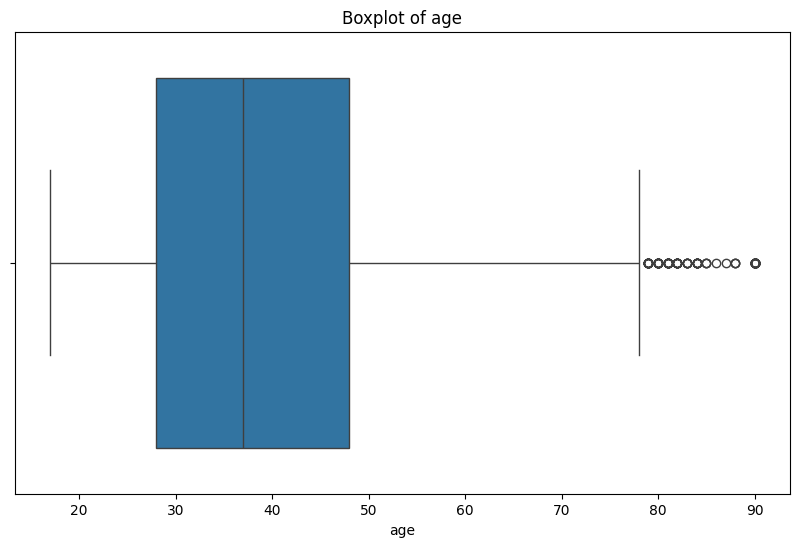

Outliers pada age sudah dihandel.


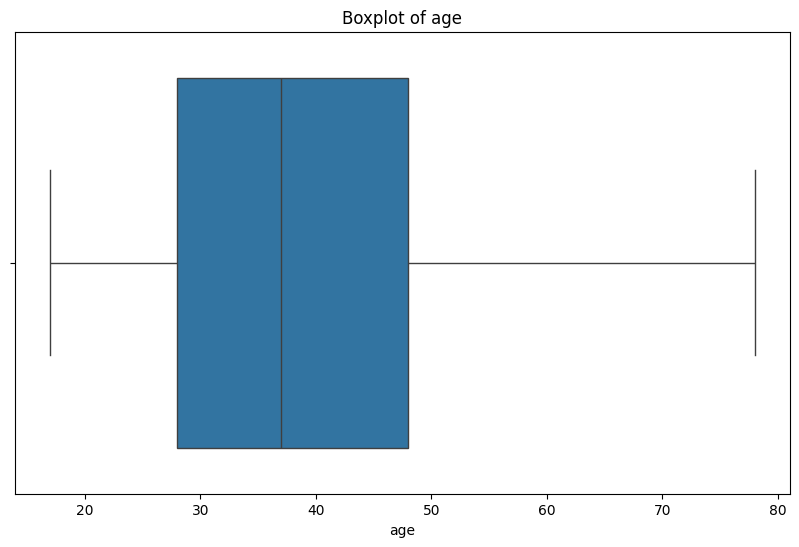

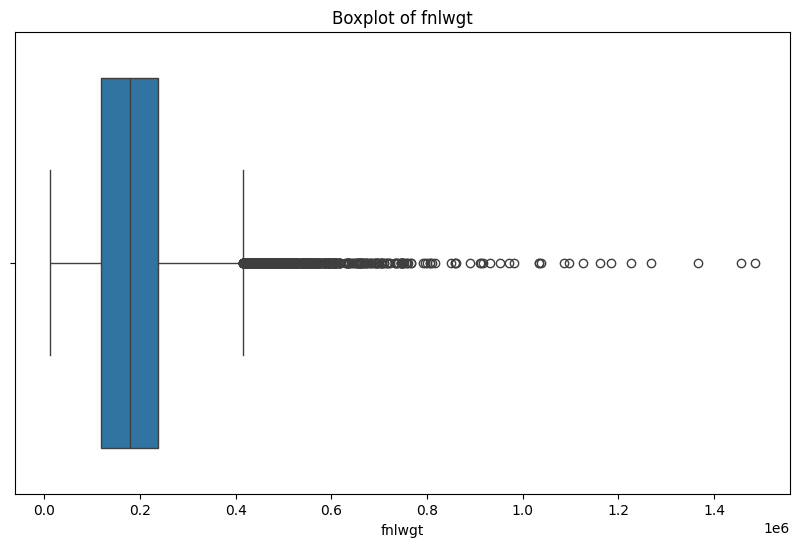

Outliers pada fnlwgt sudah dihandel.


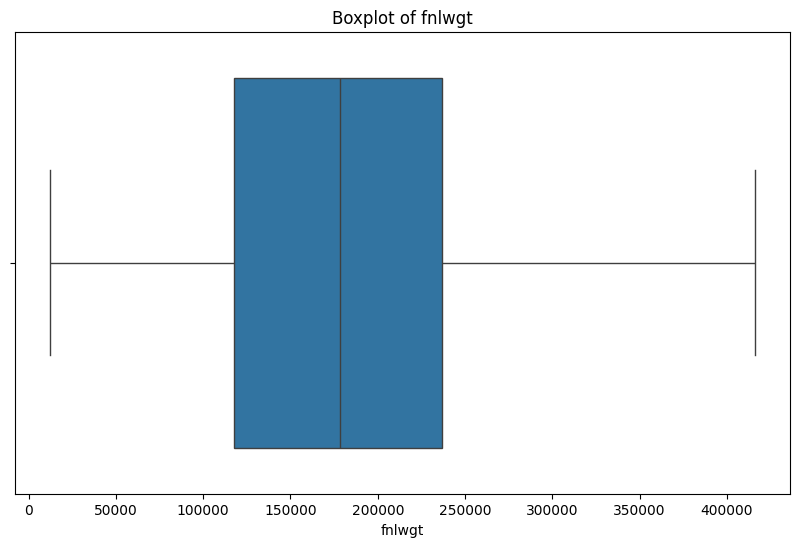

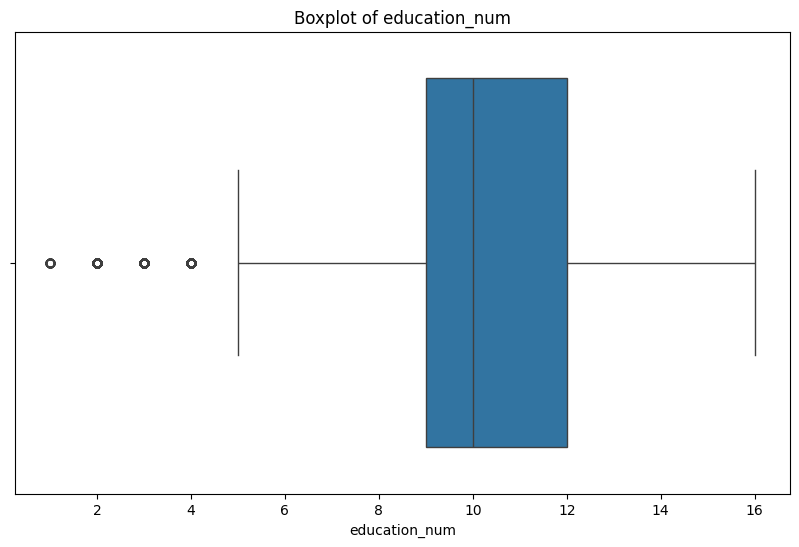

Outliers pada education_num sudah dihandel.


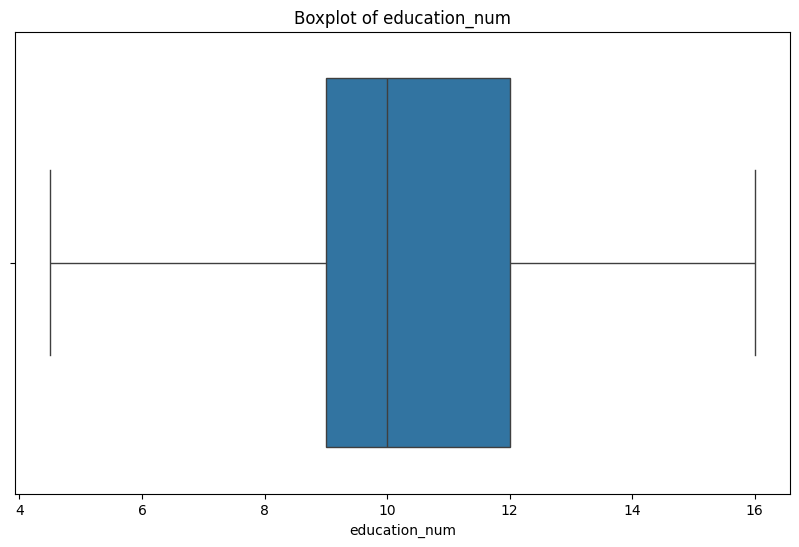

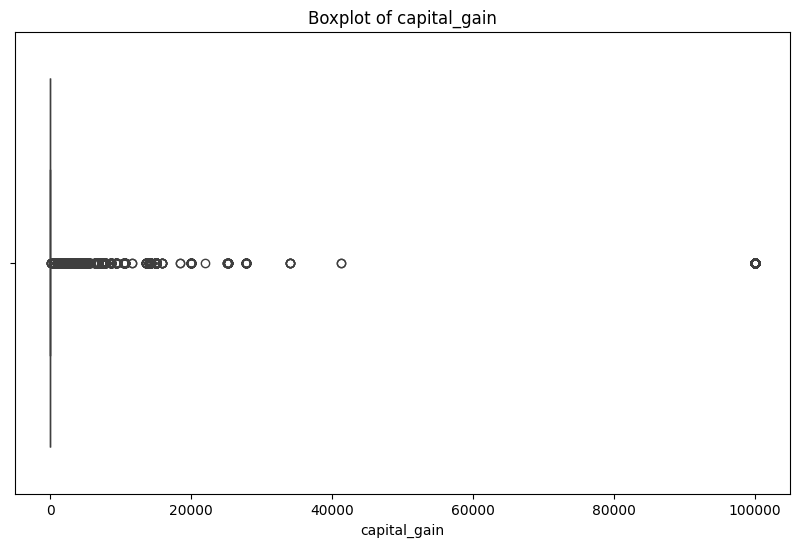

Outliers pada capital_gain sudah dihandel.


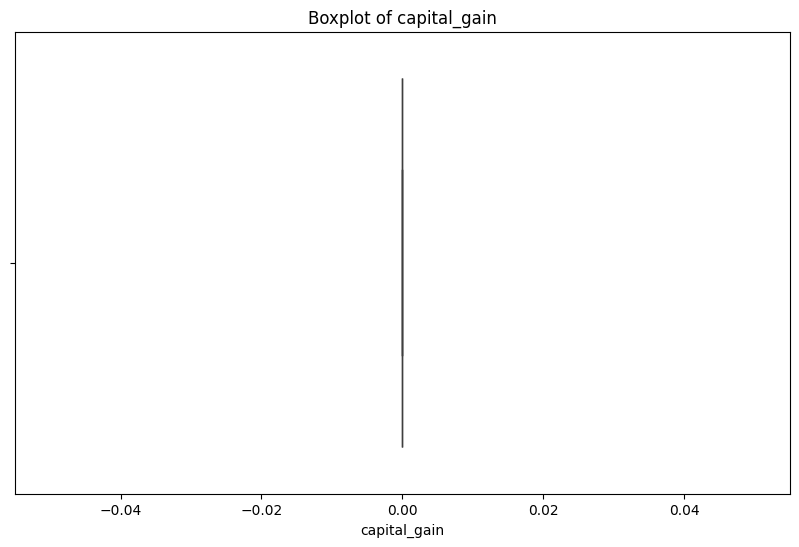

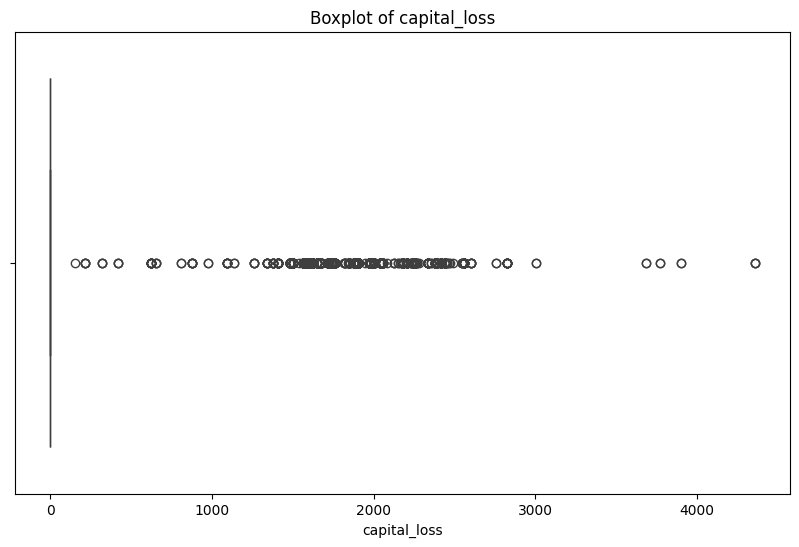

Outliers pada capital_loss sudah dihandel.


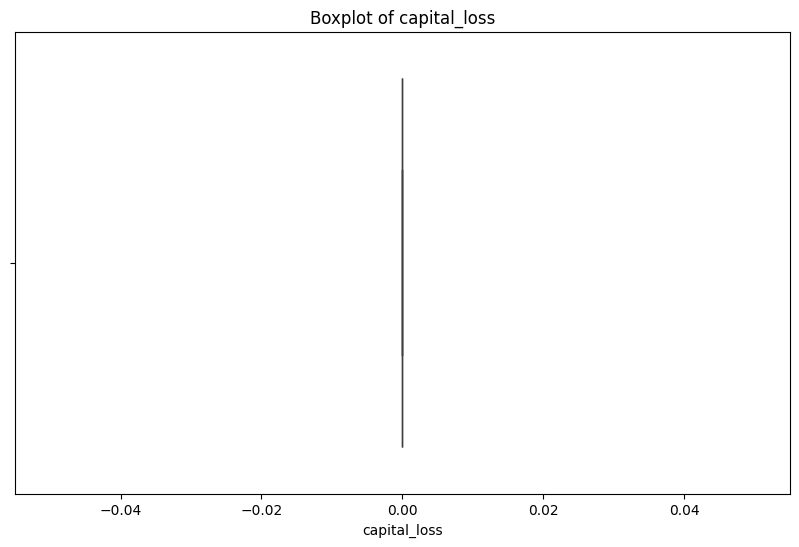

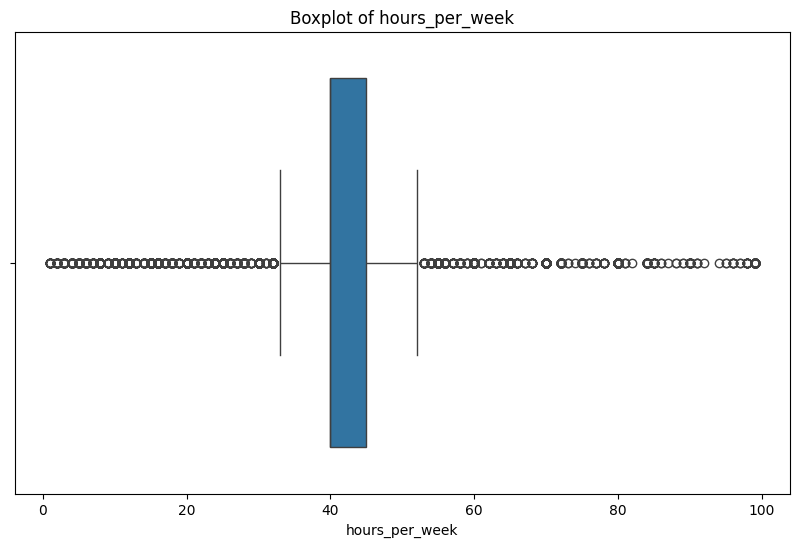

Outliers pada hours_per_week sudah dihandel.


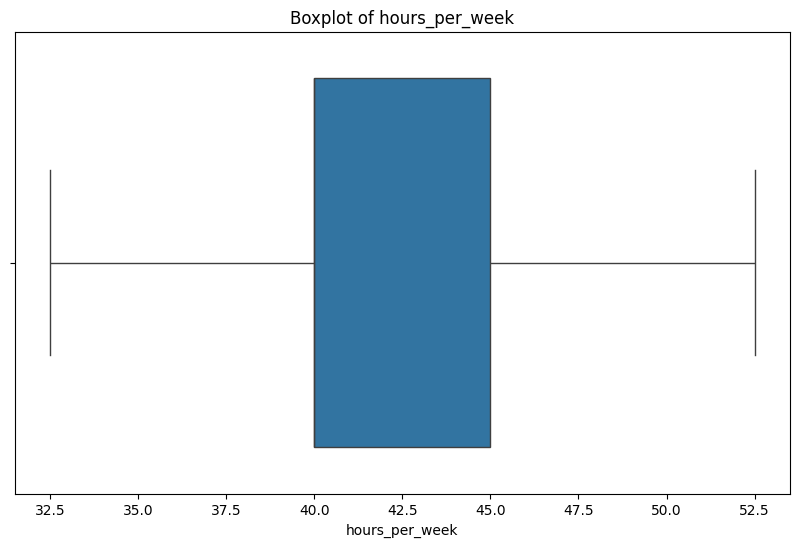

In [ ]:
def plot_boxplot(df, column):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

# Contoh untuk kolom numerik
numeric_columns = df.select_dtypes(include=[np.number]).columns

for column in numeric_columns:
    plot_boxplot(df, column)

    # Menangani outlier dengan IQR method
    Q1 = df[column].quantile(0.25) # 0.25 = 25% data
    Q3 = df[column].quantile(0.75) # 0.75 = 75% data
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df[column] = np.where(df[column] > upper_bound, upper_bound,
                          np.where(df[column] < lower_bound, lower_bound, df[column]))

    print(f"Outliers pada {column} sudah dihandel.") # Data yang outlier direplace bukan dihapus
    plot_boxplot(df, column)

Dalam menangani outlier, menggunakan IQR, IQR adalah selisih antara Q3 dan Q1.

Lower bound & upper bound adalah batasan-batasan untuk menentukan apakah suatu nilai dalam dataset adalah outlier.

Nilai-nilai yang berada di bawah lower bound atau di atas upper bound dianggap outlier, yang berarti mereka sangat berbeda dari mayoritas data dan dapat mengganggu analisis statistik.

Dengan menentukan batas-batas ini, dapat:
*   Mengidentifikasi data yang mungkin perlu diperiksa lebih lanjut.
*   Menentukan apakah outlier tersebut adalah hasil kesalahan pengumpulan data atau sebenarnya adalah fenomena yang menarik dan perlu dianalisis lebih lanjut
*   Membersihkan data dengan cara menghapus atau memperbaiki outlier jika mereka diketahui sebagai anomali yang tidak relevan.

In [ ]:
# Periksa range nilai untuk kolom numerik
for col in numeric_columns:
    print(f"\nRange nilai untuk {col}:")
    print(f"Min: {df[col].min()}, Max: {df[col].max()}")

# Periksa kategori unik untuk kolom kategorikal
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nKategori unik dalam {col}:")
    print(df[col].unique())


Range nilai untuk age:
Min: 17.0, Max: 78.0

Range nilai untuk fnlwgt:
Min: 12285.0, Max: 415887.0

Range nilai untuk education_num:
Min: 4.5, Max: 16.0

Range nilai untuk capital_gain:
Min: 0.0, Max: 0.0

Range nilai untuk capital_loss:
Min: 0.0, Max: 0.0

Range nilai untuk hours_per_week:
Min: 32.5, Max: 52.5

Kategori unik dalam workclass:
['State-gov' 'Self-emp-not-inc' 'Private' 'Federal-gov' 'Local-gov'
 'Self-emp-inc' 'Without-pay' 'Never-worked']

Kategori unik dalam education:
['Bachelors' 'HS-grad' '11th' 'Masters' '9th' 'Some-college' 'Assoc-acdm'
 'Assoc-voc' '7th-8th' 'Doctorate' 'Prof-school' '5th-6th' '10th'
 '1st-4th' 'Preschool' '12th']

Kategori unik dalam marital_status:
['Never-married' 'Married-civ-spouse' 'Divorced' 'Married-spouse-absent'
 'Separated' 'Married-AF-spouse' 'Widowed']

Kategori unik dalam occupation:
['Adm-clerical' 'Exec-managerial' 'Handlers-cleaners' 'Prof-specialty'
 'Other-service' 'Sales' 'Craft-repair' 'Transport-moving'
 'Farming-fishing' '

In [ ]:
# Memastikan Tipe Data Kembali
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             32561 non-null  float64
 1   workclass       32561 non-null  object 
 2   fnlwgt          32561 non-null  float64
 3   education       32561 non-null  object 
 4   education_num   32561 non-null  float64
 5   marital_status  32561 non-null  object 
 6   occupation      32561 non-null  object 
 7   relationship    32561 non-null  object 
 8   race            32561 non-null  object 
 9   sex             32561 non-null  object 
 10  capital_gain    32561 non-null  float64
 11  capital_loss    32561 non-null  float64
 12  hours_per_week  32561 non-null  float64
 13  native_country  32561 non-null  object 
 14  income          32561 non-null  object 
dtypes: float64(6), object(9)
memory usage: 3.7+ MB


In [ ]:
# Cek duplikat
duplicate_count = df.duplicated().sum()
print(f"Jumlah baris duplikat: {duplicate_count}")

# Bisa bertambah dari cek duplikat di awal, karena adanya replace data pada outlier dan handle data missing

# Hapus duplikat
df.drop_duplicates(inplace=True)

print(f"Jumlah baris setelah menghapus duplikat: {len(df)}")

Jumlah baris duplikat: 53
Jumlah baris setelah menghapus duplikat: 32508


In [ ]:
# Validasi hasil pembersihan
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39.0,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
1,50.0,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,32.5,United-States,<=50K
2,38.0,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53.0,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28.0,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


In [ ]:
# Simpan data yang telah dibersihkan
sys.path.append(f'{folder_name}')
df.to_csv(f'{folder_name}/adult_income_cleaned.csv', index=False)
print("Data yang telah dibersihkan telah disimpan sebagai 'adult_income_cleaned.csv'")

Data yang telah dibersihkan telah disimpan sebagai 'adult_income_cleaned.csv'


Kode ini akan menyimpan data hasil pembersihan dengan nama file baru sehingga untuk selanjutnya akan dipanggil file ini

Untuk script load drive bisa disisipkan sebelum script simpan

#**UNIT 6 : MENGKONSTRUKSI DATA**

Tujuan : Mempersiapkan dan mengorganisir data untuk analisis dan pemodelan, termasuk feature engineering dan transformasi data

Membuat fitur baru bisa dilakukan dengan membuat interval data atau membuat fitur berdasarkan operasi aritmatika

In [ ]:
# Membuat fitur baru berdasarkan usia
df['age_group'] = pd.cut(df['age'], bins=[0, 18, 30, 45, 60, 100], labels=['Remaja', 'Dewasa Muda', 'Dewasa', 'Paruh Baya', 'Lansia'])

# Menggabungkan capital gain dan loss
df['net_capital'] = df['capital_gain'] - df['capital_loss']

# Membuat fitur rasio jam kerja terhadap rata-rata
df['work_hour_ratio'] = df['hours_per_week'] / df['hours_per_week'].mean()

# Membuat fitur kategorikal baru berdasarkan education_num
df['education_level'] = pd.cut(df['education_num'], bins=[0, 8, 12, 16, 20], labels=['Dasar', 'Menengah', 'Sarjana', 'Pascasarjana'])

print(df[['age_group', 'net_capital', 'work_hour_ratio', 'education_level']].head())

     age_group  net_capital  work_hour_ratio education_level
0       Dewasa          0.0         0.970669         Sarjana
1   Paruh Baya          0.0         0.788668         Sarjana
2       Dewasa          0.0         0.970669        Menengah
3   Paruh Baya          0.0         0.970669           Dasar
4  Dewasa Muda          0.0         0.970669         Sarjana


In [ ]:
# Memeriksa semua fitur kembali
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32508 entries, 0 to 32560
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   age              32508 non-null  float64 
 1   workclass        32508 non-null  object  
 2   fnlwgt           32508 non-null  float64 
 3   education        32508 non-null  object  
 4   education_num    32508 non-null  float64 
 5   marital_status   32508 non-null  object  
 6   occupation       32508 non-null  object  
 7   relationship     32508 non-null  object  
 8   race             32508 non-null  object  
 9   sex              32508 non-null  object  
 10  capital_gain     32508 non-null  float64 
 11  capital_loss     32508 non-null  float64 
 12  hours_per_week   32508 non-null  float64 
 13  native_country   32508 non-null  object  
 14  income           32508 non-null  object  
 15  age_group        32508 non-null  category
 16  net_capital      32508 non-null  float64 
 17

In [ ]:
# Menampilkan semua data
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,age_group,net_capital,work_hour_ratio,education_level
0,39.0,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K,Dewasa,0.0,0.970669,Sarjana
1,50.0,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,32.5,United-States,<=50K,Paruh Baya,0.0,0.788668,Sarjana
2,38.0,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K,Dewasa,0.0,0.970669,Menengah
3,53.0,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K,Paruh Baya,0.0,0.970669,Dasar
4,28.0,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K,Dewasa Muda,0.0,0.970669,Sarjana


In [ ]:
# Periksa kategori unik untuk kolom kategorikal
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nKategori unik dalam {col}:")
    print(df[col].unique())


Kategori unik dalam workclass:
['State-gov' 'Self-emp-not-inc' 'Private' 'Federal-gov' 'Local-gov'
 'Self-emp-inc' 'Without-pay' 'Never-worked']

Kategori unik dalam education:
['Bachelors' 'HS-grad' '11th' 'Masters' '9th' 'Some-college' 'Assoc-acdm'
 'Assoc-voc' '7th-8th' 'Doctorate' 'Prof-school' '5th-6th' '10th'
 '1st-4th' 'Preschool' '12th']

Kategori unik dalam marital_status:
['Never-married' 'Married-civ-spouse' 'Divorced' 'Married-spouse-absent'
 'Separated' 'Married-AF-spouse' 'Widowed']

Kategori unik dalam occupation:
['Adm-clerical' 'Exec-managerial' 'Handlers-cleaners' 'Prof-specialty'
 'Other-service' 'Sales' 'Craft-repair' 'Transport-moving'
 'Farming-fishing' 'Machine-op-inspct' 'Tech-support' 'Protective-serv'
 'Armed-Forces' 'Priv-house-serv']

Kategori unik dalam relationship:
['Not-in-family' 'Husband' 'Wife' 'Own-child' 'Unmarried' 'Other-relative']

Kategori unik dalam race:
['White' 'Black' 'Asian-Pac-Islander' 'Amer-Indian-Eskimo' 'Other']

Kategori unik dalam 

In [ ]:
# Melakukan Mapping untuk data dengan type object dengan nilai Numerik agar dapat digunakan dalam kegiatan analisis.
workclass = {'State-gov':5, 'Self-emp-not-inc':6, 'Private':7, 'Federal-gov':4, 'Local-gov':3,
 'Self-emp-inc':2, 'Without-pay':1, 'Never-worked':0}

df['workclass'] = df['workclass'].map(workclass)

# education tidak diproses karena sudah dimapping

maritalstatus = {'Never-married':0, 'Married-civ-spouse':1, 'Divorced':2, 'Married-spouse-absent':3,
 'Separated':6, 'Married-AF-spouse':5, 'Widowed':4}

df['marital_status'] = df['marital_status'].map(maritalstatus)

occupation = {'Adm-clerical':1, 'Exec-managerial':2, 'Handlers-cleaners':3, 'Prof-specialty':4,
 'Other-service':5, 'Sales':6, 'Craft-repair':7, 'Transport-moving':8,
 'Farming-fishing':9, 'Machine-op-inspct':10, 'Tech-support':11,
 'Protective-serv':12, 'Armed-Forces':13, 'Priv-house-serv':14}

df['occupation'] = df['occupation'].map(occupation)

relationship = {'Not-in-family':1, 'Husband':2, 'Wife':3, 'Own-child':4, 'Unmarried':0, 'Other-relative':5}

df['relationship'] = df['relationship'].map(relationship)

race ={'White':1, 'Black':2, 'Asian-Pac-Islander':3, 'Amer-Indian-Eskimo':4, 'Other':5}

df['race'] = df['race'].map(race)

sex = {'Male':1, 'Female':0}

df['sex'] = df['sex'].map(sex)

nativecountry ={'United-States':1, 'Cuba':2, 'Jamaica':3, 'India':4, 'Mexico':5, 'South':6,
 'Puerto-Rico':7, 'Honduras':8, 'England':9, 'Canada':10, 'Germany':11, 'Iran':12,
 'Philippines':13, 'Italy':14, 'Poland':15, 'Columbia':16, 'Cambodia':17, 'Thailand':18, 'Ecuador':19,
 'Laos':20, 'Taiwan':21, 'Haiti':22, 'Portugal':23, 'Dominican-Republic':24, 'El-Salvador':25,
 'France':26, 'Guatemala':27, 'China':28, 'Japan':29, 'Yugoslavia':30, 'Peru':31,
 'Outlying-US(Guam-USVI-etc)':32, 'Scotland':33, 'Trinadad&Tobago':34, 'Greece':35,
 'Nicaragua':36, 'Vietnam':37, 'Hong':38, 'Ireland':39, 'Hungary':40, 'Holand-Netherlands':41}

df['native_country'] = df['native_country'].map(nativecountry)

income = {'<=50K':0, '>50K':1}

df['income'] = df['income'].map(income)

# tambahan
age_group = {'Remaja':1, 'Dewasa Muda':2, 'Dewasa':3, 'Paruh Baya':4, 'Lansia':5}
df['age_group'] = df['age_group'].map(age_group)

education_level = {'Dasar':1, 'Menengah':2, 'Sarjana':3, 'Pascasarjana':4}
df['education_level'] = df['education_level'].map(education_level)

In [ ]:
# Cek kembali data hasil mapping
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,age_group,net_capital,work_hour_ratio,education_level
0,39.0,5,77516.0,Bachelors,13.0,0,1,1,1,1,0.0,0.0,40.0,1,0,3,0.0,0.970669,3
1,50.0,6,83311.0,Bachelors,13.0,1,2,2,1,1,0.0,0.0,32.5,1,0,4,0.0,0.788668,3
2,38.0,7,215646.0,HS-grad,9.0,2,3,1,1,1,0.0,0.0,40.0,1,0,3,0.0,0.970669,2
3,53.0,7,234721.0,11th,7.0,1,3,2,2,1,0.0,0.0,40.0,1,0,4,0.0,0.970669,1
4,28.0,7,338409.0,Bachelors,13.0,1,4,3,2,0,0.0,0.0,40.0,2,0,2,0.0,0.970669,3


In [ ]:
# Drop education karena sudah ada education_num
df = df.drop('education', axis=1)

In [ ]:
# Periksa fitur yang di drop
df.head()

,age,workclass,fnlwgt,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,age_group,net_capital,work_hour_ratio,education_level
0,39.0,5,77516.0,13.0,0,1,1,1,1,0.0,0.0,40.0,1,0,3,0.0,0.970669,3
1,50.0,6,83311.0,13.0,1,2,2,1,1,0.0,0.0,32.5,1,0,4,0.0,0.788668,3
2,38.0,7,215646.0,9.0,2,3,1,1,1,0.0,0.0,40.0,1,0,3,0.0,0.970669,2
3,53.0,7,234721.0,7.0,1,3,2,2,1,0.0,0.0,40.0,1,0,4,0.0,0.970669,1
4,28.0,7,338409.0,13.0,1,4,3,2,0,0.0,0.0,40.0,2,0,2,0.0,0.970669,3


In [ ]:
# Periksa tipe data dari fitur
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32508 entries, 0 to 32560
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   age              32508 non-null  float64 
 1   workclass        32508 non-null  int64   
 2   fnlwgt           32508 non-null  float64 
 3   education_num    32508 non-null  float64 
 4   marital_status   32508 non-null  int64   
 5   occupation       32508 non-null  int64   
 6   relationship     32508 non-null  int64   
 7   race             32508 non-null  int64   
 8   sex              32508 non-null  int64   
 9   capital_gain     32508 non-null  float64 
 10  capital_loss     32508 non-null  float64 
 11  hours_per_week   32508 non-null  float64 
 12  native_country   32508 non-null  int64   
 13  income           32508 non-null  int64   
 14  age_group        32508 non-null  category
 15  net_capital      32508 non-null  float64 
 16  work_hour_ratio  32508 non-null  float64 
 17

In [ ]:
# Perubahan tipe data untuk feature age_group dan education_level

# df['nama_kolom'] = df['nama_kolom'].astype(str).astype(float)
df['age_group'] = df['age_group'].astype(str).astype(float)
df['education_level'] = df['education_level'].astype(str).astype(float)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32508 entries, 0 to 32560
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              32508 non-null  float64
 1   workclass        32508 non-null  int64  
 2   fnlwgt           32508 non-null  float64
 3   education_num    32508 non-null  float64
 4   marital_status   32508 non-null  int64  
 5   occupation       32508 non-null  int64  
 6   relationship     32508 non-null  int64  
 7   race             32508 non-null  int64  
 8   sex              32508 non-null  int64  
 9   capital_gain     32508 non-null  float64
 10  capital_loss     32508 non-null  float64
 11  hours_per_week   32508 non-null  float64
 12  native_country   32508 non-null  int64  
 13  income           32508 non-null  int64  
 14  age_group        32508 non-null  float64
 15  net_capital      32508 non-null  float64
 16  work_hour_ratio  32508 non-null  float64
 17  education_level  

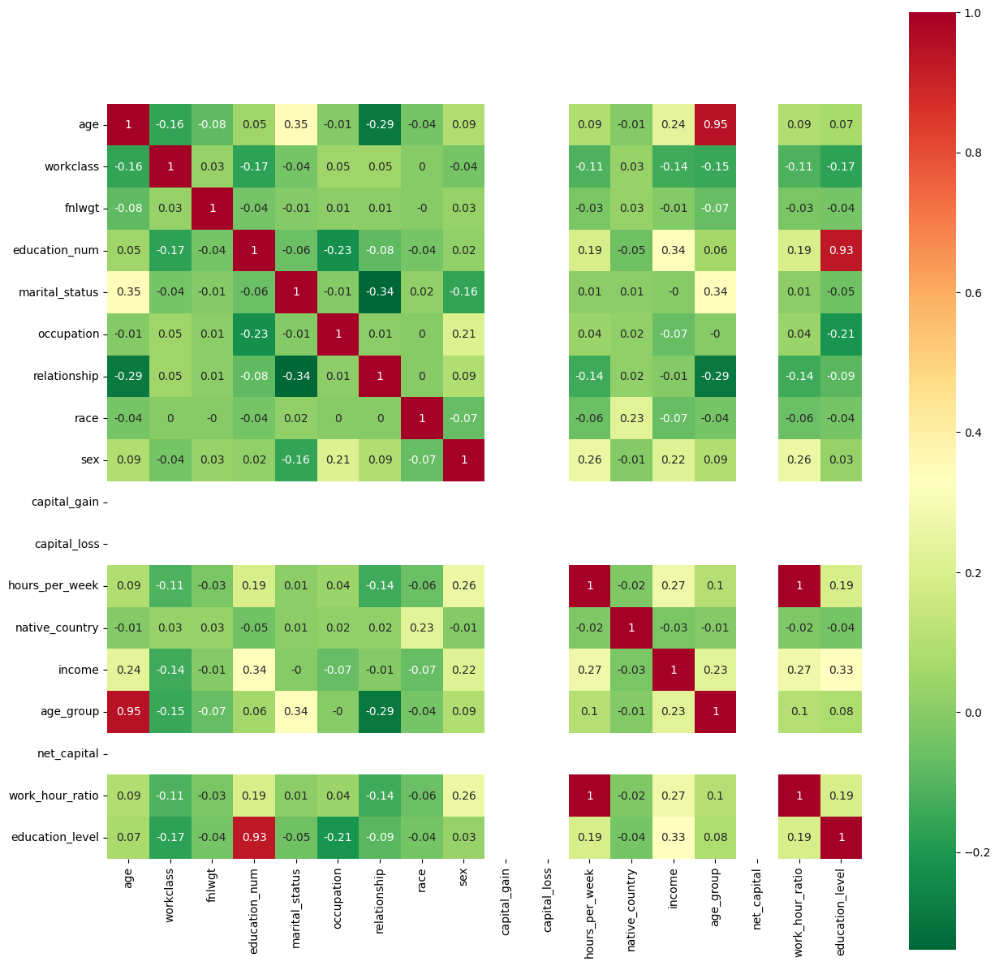

In [ ]:
# Correlation Heatmap
correlation = df.corr()
plt.subplots(figsize = (15,15))
sns.heatmap(correlation.round(2),
            annot = True,
            vmax = 1,
            square = True,
            cmap = 'RdYlGn_r')
plt.show()

In [ ]:
# Penghapusan fitur dengan nilai unik = 1
df = df.loc[:,df.apply(pd.Series.nunique) != 1]

Pada kode ini , feature dengan nilai unik hanya bernilai 1 akan dihapus dari fitur yang digunakan.

Pada kasus dataset yang digunakan tidak ditemukan fiture dengan nilai unik 1.


In [ ]:
# Penghapusan fitur dengan korelasi tinggi
# find and remove correlated features
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
# menghapus data tanpa fitur
data_tanpa_fitur = df.drop('income', axis=1)

In [ ]:
# mendeteksi fitur dengan kolerasi tinggi
corr_features = correlation(data_tanpa_fitur, 0.8)
print('correlated features: ', len(set(corr_features)) )
print(corr_features)

correlated features:  3
{'age_group', 'work_hour_ratio', 'education_level'}


Pada Case ini, Fitur berkolerasi dianggap kepada data tanpa feature dan feature dengan ambang batas nilai kolerasi adalah 0.8

(nilai bisa diset lebih tinggi atau lebih rendah)

In [ ]:
# Menghapus fitur dengan korelasi tinggi
# removed correlated features
df.drop(labels=corr_features, axis=1, inplace=True)

<ipython-input-48-6da38c0e59b6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(labels=corr_features, axis=1, inplace=True)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32508 entries, 0 to 32560
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             32508 non-null  float64
 1   workclass       32508 non-null  int64  
 2   fnlwgt          32508 non-null  float64
 3   education_num   32508 non-null  float64
 4   marital_status  32508 non-null  int64  
 5   occupation      32508 non-null  int64  
 6   relationship    32508 non-null  int64  
 7   race            32508 non-null  int64  
 8   sex             32508 non-null  int64  
 9   hours_per_week  32508 non-null  float64
 10  native_country  32508 non-null  int64  
 11  income          32508 non-null  int64  
dtypes: float64(4), int64(8)
memory usage: 3.2 MB


In [ ]:
df.describe()

,age,workclass,fnlwgt,education_num,marital_status,occupation,relationship,race,sex,hours_per_week,native_country,income
count,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000,32508.000000
mean,38.573397,6.320198,186773.668174,10.125185,1.086963,5.188292,1.982097,1.221884,0.669404,41.208702,2.140089,0.241018
std,13.551409,1.398531,95073.478554,2.459865,1.257985,2.961003,1.272457,0.627616,0.470435,6.185439,4.815915,0.427708
min,17.000000,0.000000,12285.000000,4.500000,0.000000,1.000000,0.000000,1.000000,0.000000,32.500000,1.000000,0.000000
25%,28.000000,7.000000,117801.000000,9.000000,0.000000,3.000000,1.000000,1.000000,0.000000,40.000000,1.000000,0.000000
50%,37.000000,7.000000,178348.500000,10.000000,1.000000,5.000000,2.000000,1.000000,1.000000,40.000000,1.000000,0.000000
75%,48.000000,7.000000,236979.000000,12.000000,1.000000,7.000000,2.000000,1.000000,1.000000,45.000000,1.000000,0.000000
max,78.000000,7.000000,415887.000000,16.000000,6.000000,14.000000,5.000000,5.000000,1.000000,52.500000,41.000000,1.000000


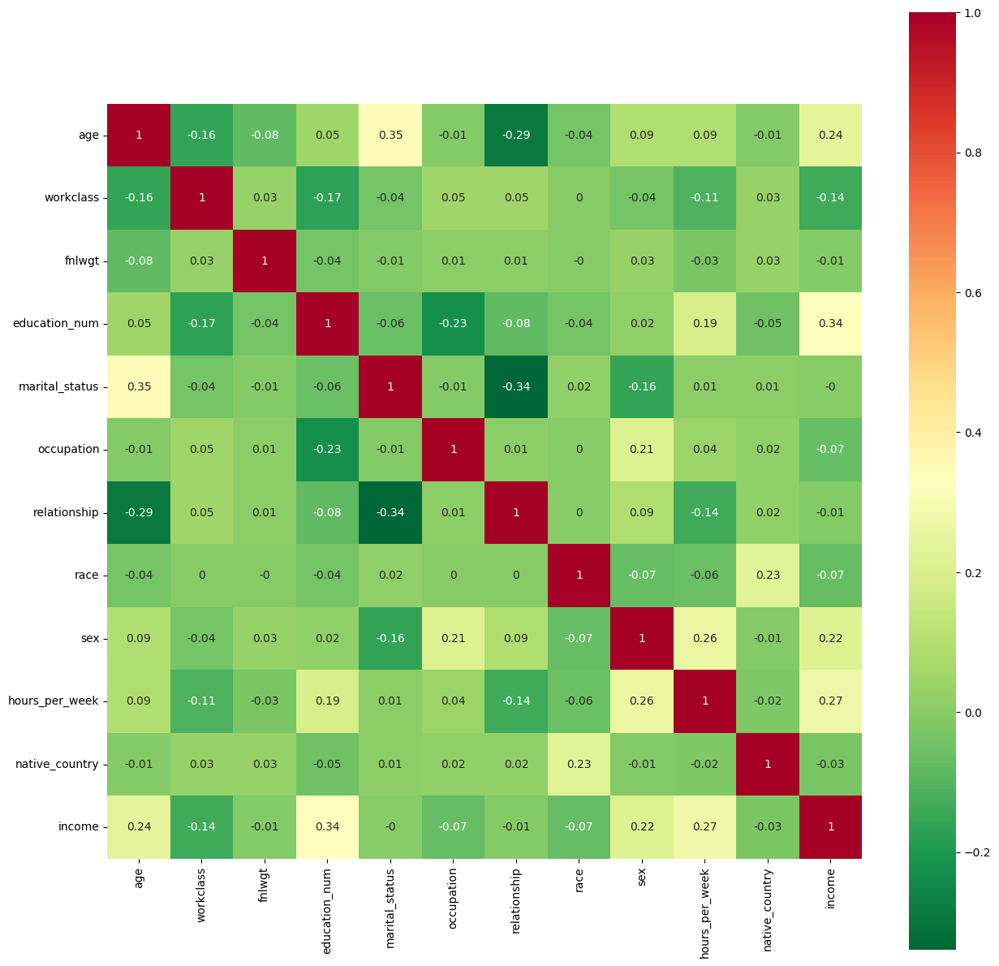

In [ ]:
# Correlation Heatmap
correlation = df.corr()
plt.subplots(figsize = (15,15))
sns.heatmap(correlation.round(2),
            annot = True,
            vmax = 1,
            square = True,
            cmap = 'RdYlGn_r')
plt.show()

#**UNIT 7 : MEMBANGUN MODEL**

Sehubungan dengan target yang digunakan adalah income, maka kita membuang fitur income pada variabel x, dan memasukkan fitur income kedalam variabel y (target).

In [ ]:
from sklearn.model_selection import train_test_split
# Pisahkan fitur dan target
X = df.drop('income', axis=1)
y = df['income']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

Pada kasus ini kita menggunakan decision tree sebagai contoh model klasifikasi yang diusulkan. Tujuan dari penggunaan model ini selain mendapatkan hasil klasifikasi terhadap income, insight yang dihasilkan akan menjelaskan fitur-fitur apa saja yang mempengaruhi income seseorang berdasarkan dataset yang diolah pada langkah sebelumnnya.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, recall_score,precision_score,classification_report, confusion_matrix

# Inisialisasi model
dt_model = DecisionTreeClassifier(random_state=42)

# Melatih model
dt_model.fit(X_train, y_train)

# Prediksi
y_pred_dt = dt_model.predict(X_test)

In [ ]:
# Evaluasi
print("Decision Tree Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test,y_pred_dt, average='micro'))
print('Recall:', recall_score(y_test,y_pred_dt, average='micro'))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt))

Decision Tree Performance:
Accuracy: 0.7713011381113504
Precision: 0.7713011381113504
Recall: 0.7713011381113504

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      4935
           1       0.52      0.55      0.54      1567

    accuracy                           0.77      6502
   macro avg       0.69      0.70      0.69      6502
weighted avg       0.78      0.77      0.77      6502



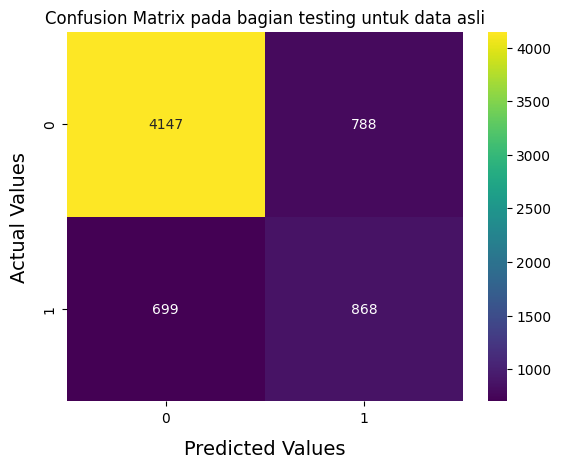

In [ ]:
# Melakukan Penilaian Evaluasi Matrix Dengan Confusion Matrix
sns.heatmap(confusion_matrix(y_test,y_pred_dt),annot=True,cmap='viridis', fmt='.0f')
plt.xlabel('Predicted Values', fontdict={'size':14}, labelpad=10)
plt.ylabel('Actual Values', fontdict={'size':14}, labelpad=10)
plt.title('Confusion Matrix pada bagian testing untuk data asli')
plt.show()

Komponen-Komponennya:

Sumbu X: Predicted Values (Nilai Prediksi)
*   0: Model memprediksi income ≤50K
*   1: Model memprediksi income >50K

Sumbu Y: Actual Values (Nilai Sebenarnya)
*   0: Income sebenarnya ≤50K
*   1: Income sebenarnya >50K

Nilai dalam setiap sel:
*   Kiri Atas (4147): True Negatives (TN) - Benar diprediksi ≤50K
*   Kanan Atas (788): False Positives (FP) - Salah diprediksi >50K
*   Kiri Bawah (699): False Negatives (FN) - Salah diprediksi ≤50K
*   Kanan Bawah (868): True Positives (TP) - Benar diprediksi >50K

Interpretasi:
*   Akurasi: Model benar dalam (4147 + 868) / (4147 + 788 + 699 + 868) = 77.1% kasus.
*   Presisi untuk >50K: 868 / (788 + 868) = 52.4% dari prediksi >50K benar.
*   Recall untuk >50K: 868 / (699 + 868) = 55.4% dari actual >50K terdeteksi.
*   Model cenderung lebih baik dalam memprediksi income ≤50K (4147 benar vs 788 salah).
*   Ada jumlah signifikan false positives (788) dan false negatives (699), menunjukkan ada ruang untuk peningkatan.


Feature Importance adalah teknik untuk menentukan seberapa penting atau berpengaruh suatu fitur (atau variabel) terhadap model prediksi dalam machine learning. Dalam konteks decision tree dan random forest, fitur yang memiliki importance yang tinggi dianggap sebagai fitur yang sangat berkontribusi terhadap keputusan model.

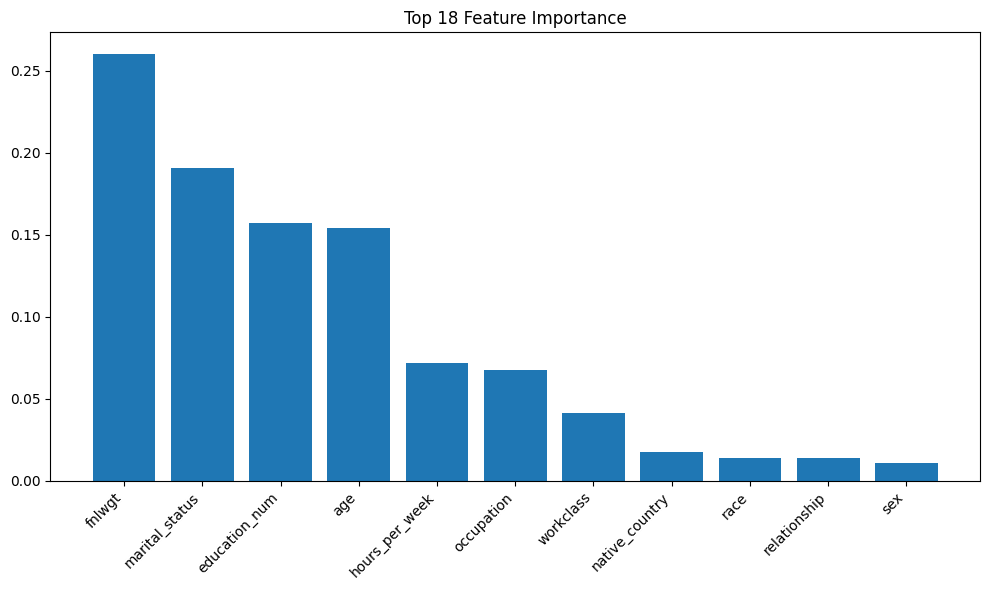

In [ ]:
feature_importance = pd.DataFrame({'feature': X.columns, 'importance': dt_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10,6))
plt.bar(feature_importance['feature'][:18], feature_importance['importance'][:18])
plt.title('Top 18 Feature Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Hyperparameter Tuning**

Digunakan untuk menemukan performa terbaik dari sebuah model dengan mengatur nilai parameter

In [ ]:
from sklearn.model_selection import GridSearchCV

# Definisikan parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Inisialisasi GridSearchCV
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, scoring='accuracy')

# Lakukan pencarian
grid_search.fit(X_train, y_train)

# Tampilkan parameter terbaik
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Gunakan model terbaik
best_dt_model = grid_search.best_estimator_

# Prediksi dengan model terbaik
y_pred_best_dt = best_dt_model.predict(X_test)

Best parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best cross-validation score: 0.8252327041179862


In [ ]:
# Melihat hasil evaluasi berdasarkan model terbaik
# Evaluasi model terbaik
print("\nBest Decision Tree Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_best_dt))
print("Precision:", precision_score(y_test,y_pred_best_dt, average='micro'))
print('Recall:', recall_score(y_test,y_pred_best_dt, average='micro'))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_best_dt))


Best Decision Tree Performance:
Accuracy: 0.8295908951091971
Precision: 0.8295908951091971
Recall: 0.8295908951091971

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      4935
           1       0.66      0.59      0.63      1567

    accuracy                           0.83      6502
   macro avg       0.77      0.75      0.76      6502
weighted avg       0.82      0.83      0.83      6502



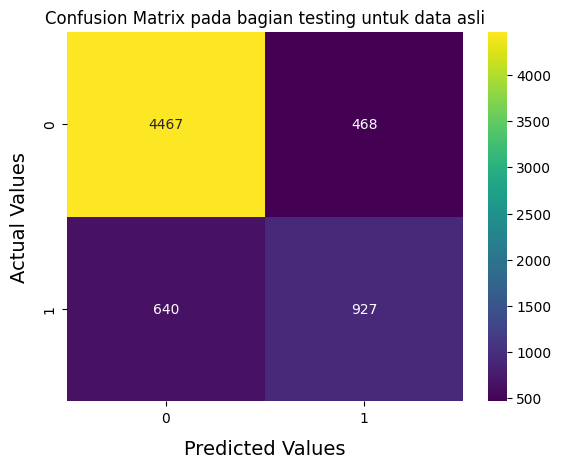

In [ ]:
# Melihat Metric Confusion
sns.heatmap(confusion_matrix(y_test,y_pred_best_dt),annot=True,cmap='viridis', fmt='.0f')
plt.xlabel('Predicted Values', fontdict={'size':14}, labelpad=10)
plt.ylabel('Actual Values', fontdict={'size':14}, labelpad=10)
plt.title('Confusion Matrix pada bagian testing untuk data asli')
plt.show()

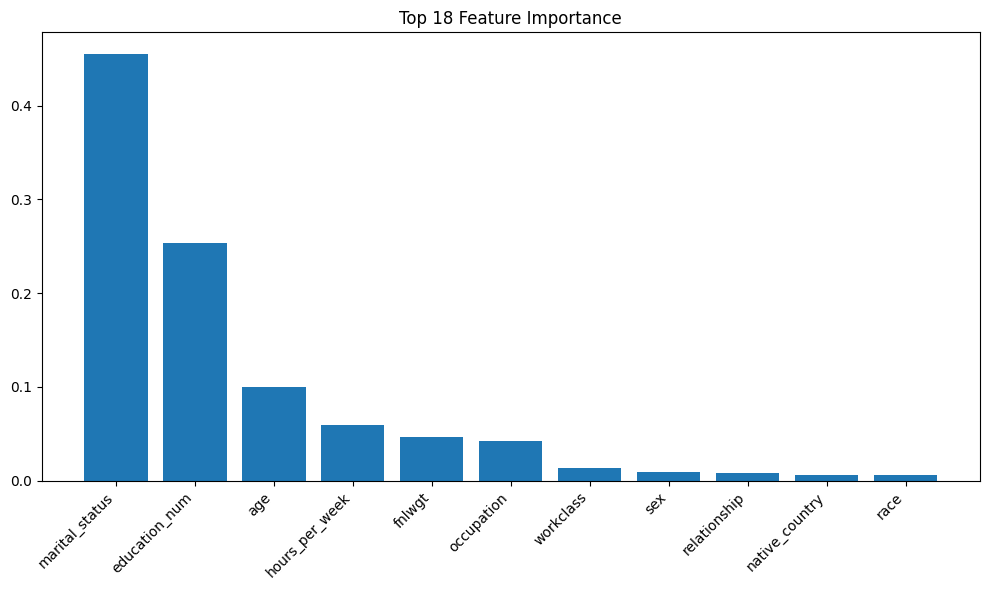

In [ ]:
# Melihat Feature Importance Berdasarkan Model Terbaik
feature_importance = pd.DataFrame({'feature': X.columns, 'importance': best_dt_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10,6))
plt.bar(feature_importance['feature'][:18], feature_importance['importance'][:18])
plt.title('Top 18 Feature Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
import joblib

# Simpan model terbaik
joblib.dump(best_dt_model, f'{folder_name}/best_income_predictor_model.joblib')
print("Model terbaik telah disimpan sebagai 'best_income_predictor_model.joblib'")

Model terbaik telah disimpan sebagai 'best_income_predictor_model.joblib'


Cek underfitting atau overfitting untuk hyperparameter

Membandingkan Akurasi Training VS Testing

In [ ]:
from sklearn.metrics import accuracy_score

# Untuk model Decision Tree terbaik
y_train_pred = best_dt_model.predict(X_train)
y_test_pred = best_dt_model.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.8466123202337922
Testing Accuracy: 0.8295908951091971


note:
*   Jika train_accuracy jauh lebih tinggi dari test_accuracy, ini indikasi overfitting.
*   Jika keduanya rendah dan hampir sama, ini bisa jadi indikasi underfitting.


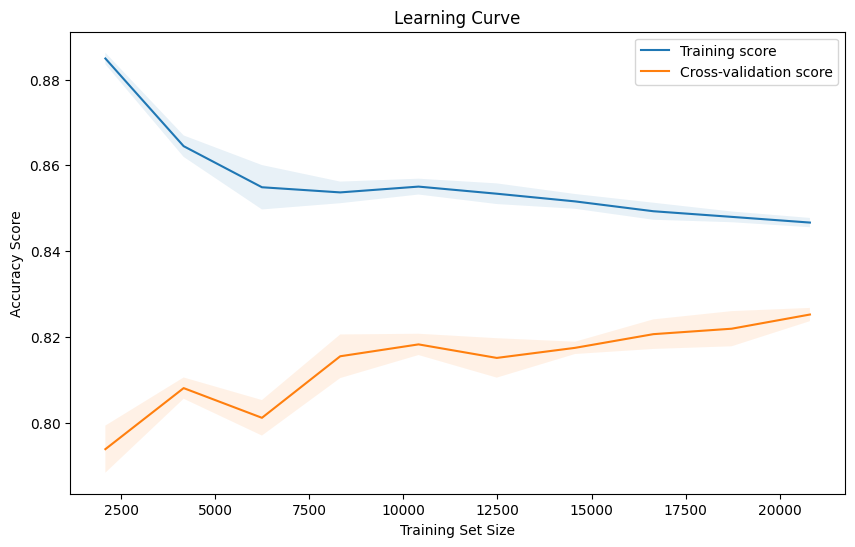

In [ ]:
# Learning Curve
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

train_sizes, train_scores, test_scores = learning_curve(
    best_dt_model, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_mean, label='Training score')
plt.plot(train_sizes, test_mean, label='Cross-validation score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1)
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy Score')
plt.title('Learning Curve')
plt.legend()
plt.show()

In [ ]:
# Cross Validation Score
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(best_dt_model, X_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Mean CV score:", np.mean(cv_scores))
print("Standard deviation of CV score:", np.std(cv_scores))

Cross-validation scores: [0.82352941 0.82445684 0.82407229 0.82657181 0.82753317]
Mean CV score: 0.8252327041179862
Standard deviation of CV score: 0.0015449964722924073


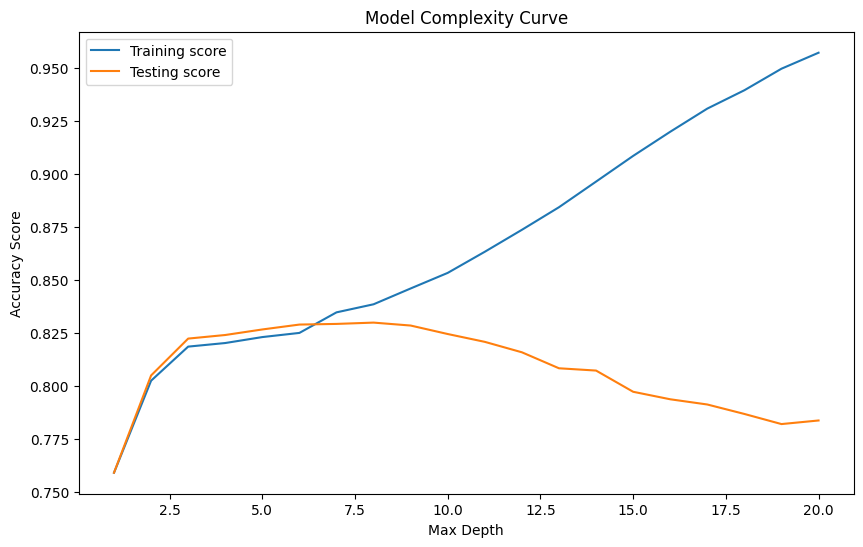

In [ ]:
# Complexity Curve (untuk Decision Tree):
max_depths = range(1, 21)  #digunakan untuk nilai integer dari 1 sampai 20
train_scores = []
test_scores = []

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    dt.fit(X_train, y_train)
    train_scores.append(accuracy_score(y_train, dt.predict(X_train)))
    test_scores.append(accuracy_score(y_test, dt.predict(X_test)))

plt.figure(figsize=(10,6))
plt.plot(max_depths, train_scores, label='Training score')
plt.plot(max_depths, test_scores, label='Testing score')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy Score')
plt.title('Model Complexity Curve')
plt.legend()
plt.show()

Interpretasi:
*   Jika kurva training terus naik tapi kurva testing mulai turun setelah titik tertentu, ini indikasi overfitting.
*   Jika kedua kurva rendah dan berdekatan, ini indikasi underfitting.

Observasi:
*   Underfitting: Terlihat di bagian kiri grafik (kedalaman 1-3) dimana kedua skor rendah.
*   Overfitting: Mulai terjadi setelah kedalaman sekitar 7, dimana garis biru terus naik tapi garis oranye mulai turun.
*   Sweet spot (titik optimal): Berada di sekitar kedalaman 5-7, dimana testing score mencapai puncak.

Kesimpulan:
*   Model dengan kedalaman sekitar 5-7 mungkin memberikan keseimbangan terbaik antara bias dan varians.
*   Setelah kedalaman 7, model mulai overfitting: performa pada data training terus meningkat, tapi menurun pada data testing.
*   Kedalaman pohon di atas 10 menunjukkan overfitting yang signifikan, dengan gap besar antara training dan testing score


Gambar pohon keputusan telah disimpan sebagai 'decision_tree_visualization.png'


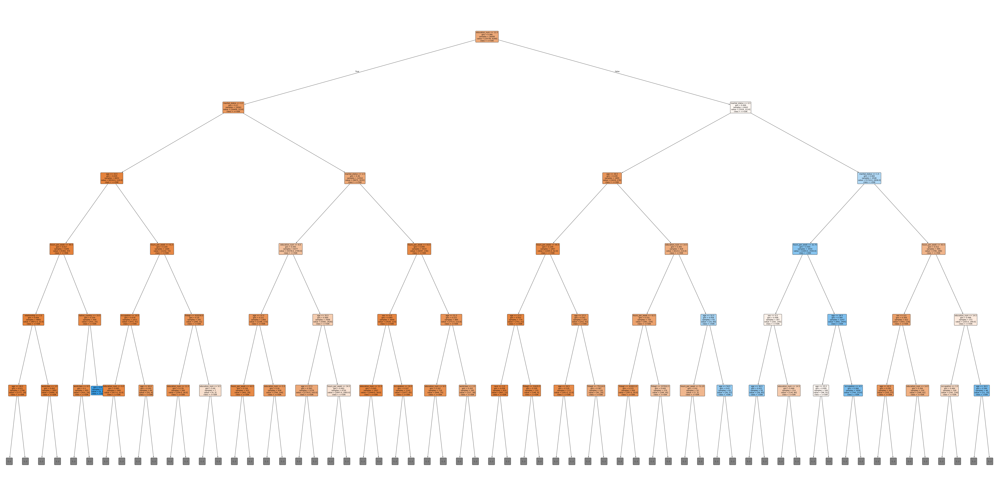

In [ ]:
# Visualisasi Decision Tree Versi Standar
from sklearn.tree import plot_tree
# Buat gambar dengan ukuran yang sangat besar - disini maxdepth dibuat 5 agar lebih cepat terbuat
plt.figure(figsize=(100, 50))  # Ukuran dalam inci

# Plot pohon keputusan
plot_tree(dt_model, feature_names=X.columns, class_names=['<=50K', '>50K'],
          filled=True, rounded=True, fontsize=10, max_depth=5)

# Simpan gambar dengan DPI tinggi
plt.savefig(f'{folder_name}/decision_tree_visualization.png', dpi=300, bbox_inches='tight')

print("Gambar pohon keputusan telah disimpan sebagai 'decision_tree_visualization.png'")

Gambar pohon keputusan telah disimpan sebagai 'best_decision_tree_visualization.png'


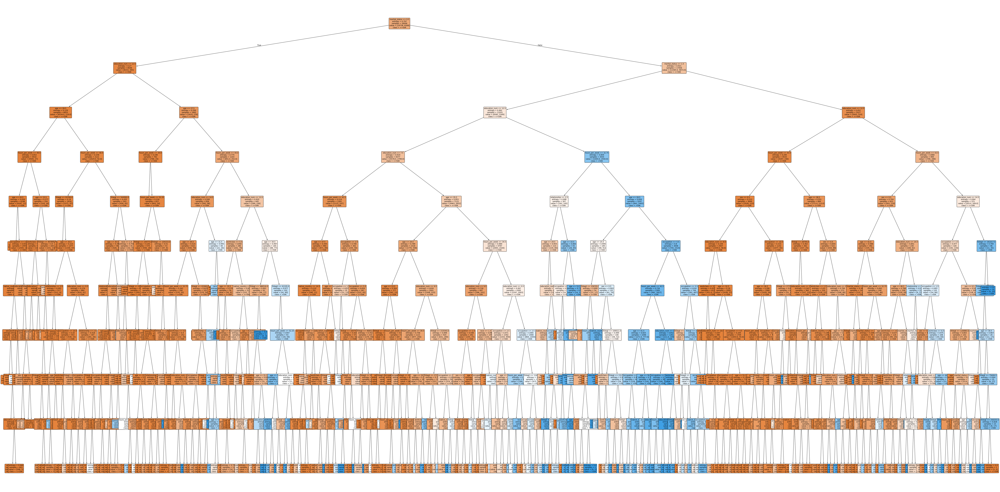

In [ ]:
# Visualisasi Decision Tree Versi Hyperparameter
# Buat gambar dengan ukuran yang sangat besar
plt.figure(figsize=(100, 50))  # Ukuran dalam inci

# Plot pohon keputusan
plot_tree(best_dt_model, feature_names=X.columns, class_names=['<=50K', '>50K'],
          filled=True, rounded=True, fontsize=10)

# Simpan gambar dengan DPI tinggi
plt.savefig(f'{folder_name}/best_decision_tree_visualization.png', dpi=300, bbox_inches='tight')

print("Gambar pohon keputusan telah disimpan sebagai 'best_decision_tree_visualization.png'")

Gambar pohon keputusan telah disimpan sebagai 'best_decision_tree_visualization.png'


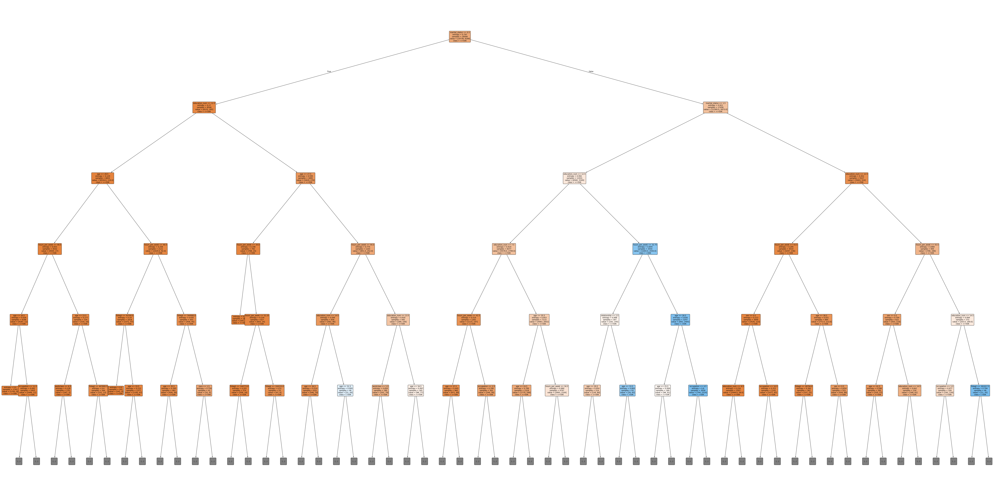

In [ ]:
# Menyimpan Hasil Decision Tree
# Buat gambar dengan ukuran yang sangat besar
plt.figure(figsize=(100, 50))  # Ukuran dalam inci

# Plot pohon keputusan
plot_tree(best_dt_model, feature_names=X.columns, class_names=['<=50K', '>50K'],
          filled=True, rounded=True, fontsize=10, max_depth=5)

# Simpan gambar dengan DPI tinggi
plt.savefig(f'{folder_name}/best_decision_tree_visualization.png', dpi=300, bbox_inches='tight')

print("Gambar pohon keputusan telah disimpan sebagai 'best_decision_tree_visualization.png'")